<a href="https://colab.research.google.com/github/Lucs1590/study_segmentation/blob/main/classical_techniques.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Segmentação de Imagens com Python de A à Z: Técnicas Clássicas de Processamento Digital de Imagens

# Importação das bibliotecas

In [ ]:
import cv2 # OpenCV
import numpy as np
from matplotlib import pyplot as plt
from google.colab.patches import cv2_imshow

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
!cp -R /content/gdrive/MyDrive/Cursos\ -\ recursos/Segmentação\ Imagens\ Python\ AZ/imagens/ imagens/

# Segmentação baseada em Limiarização (*Thresholding*) 

## Limiarização Global (*Global Thresholding*)

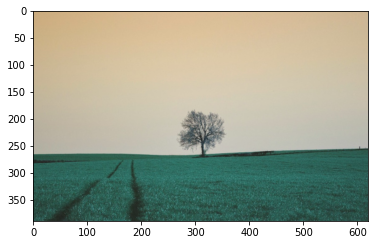

In [ ]:
img = cv2.imread('/content/imagens/paisagem01.jpg')
plt.imshow(img); # BGR

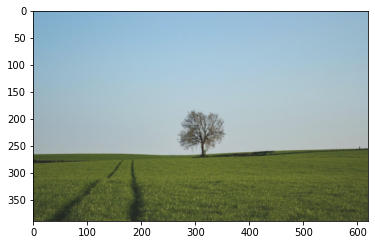

In [ ]:
rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(rgb);

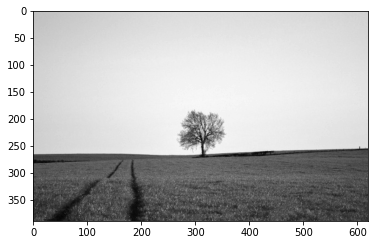

In [ ]:
gray = cv2.cvtColor(rgb, cv2.COLOR_RGB2GRAY)
plt.imshow(gray, cmap='gray');

In [ ]:
limiar = 180 # 0 - 255

In [ ]:
val, thresh = cv2.threshold(gray, limiar, 255, cv2.THRESH_BINARY)

In [ ]:
val

180.0

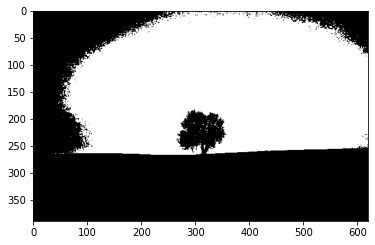

In [ ]:
plt.imshow(thresh, cmap='gray');

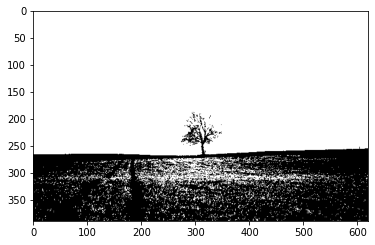

In [ ]:
limiar = 100
val, thresh = cv2.threshold(gray, limiar, 255, cv2.THRESH_BINARY)
plt.imshow(thresh, cmap = 'gray');

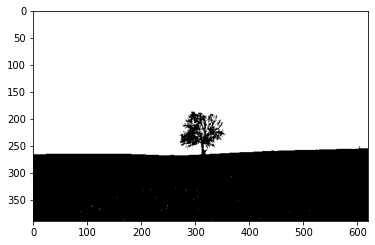

In [ ]:
limiar = 140 #@param {type: "slider", min:0, max:255, step:1}
val, thresh = cv2.threshold(gray, limiar, 255, cv2.THRESH_BINARY)
plt.imshow(thresh, cmap = 'gray');

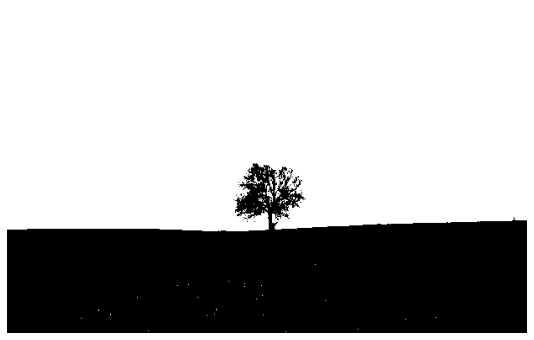

In [ ]:
fig = plt.gcf()
fig.set_size_inches(18,6)
plt.imshow(thresh, cmap='gray')
plt.axis('off')
plt.show()

In [ ]:
def mostrar(imagem):
  fig = plt.gcf()
  fig.set_size_inches(18,6)
  plt.imshow(cv2.cvtColor(imagem, cv2.COLOR_BGR2RGB), cmap='gray')
  plt.axis('off')
  plt.show()

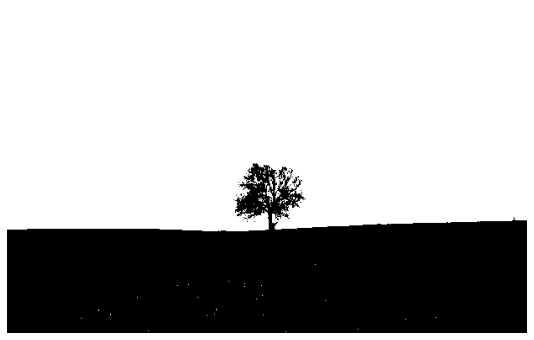

In [ ]:
mostrar(thresh)

### Salvando o resultado em um arquivo de imagem

In [ ]:
cv2.imwrite('resultado_threshold.jpg', thresh)

True

### Salvando imagem no Drive

In [ ]:
!cp resultado_threshold.jpg /content/gdrive/MyDrive/Cursos\ -\ recursos/Segmentação\ Imagens\ Python\ AZ/imagens/resultado_threshold.jpg

### Tipos de Limiarização 

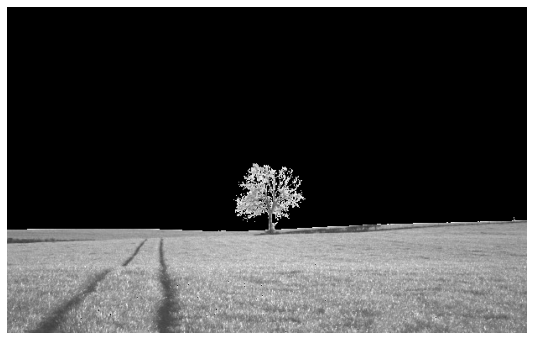

In [ ]:
#_, thresh = cv2.threshold(gray, limiar, 255, cv2.THRESH_BINARY)
#_, thresh = cv2.threshold(gray, limiar, 255, cv2.THRESH_BINARY_INV)
#_, thresh = cv2.threshold(gray, limiar, 255, cv2.THRESH_TRUNC)
#_, thresh = cv2.threshold(gray, limiar, 255, cv2.THRESH_TOZERO)
_, thresh = cv2.threshold(gray, limiar, 255, cv2.THRESH_TOZERO_INV)
mostrar(thresh)

In [ ]:
def exibir_limiarizacao(img, limiar = 127):
  _, thresh_binary = cv2.threshold(gray, limiar, 255, cv2.THRESH_BINARY)
  _, thresh_binary_inv = cv2.threshold(gray, limiar, 255, cv2.THRESH_BINARY_INV)
  _, thresh_trunc = cv2.threshold(gray, limiar, 255, cv2.THRESH_TRUNC)
  _, thresh_to_zero = cv2.threshold(gray, limiar, 255, cv2.THRESH_TOZERO)
  _, thresh_to_zero_inv = cv2.threshold(gray, limiar, 255, cv2.THRESH_TOZERO_INV)

  titulos = ['Imagem original', 'Binary', 'Binary inv', 'Trunc', 'To zero', 'To zero inv']
  imagens = [img, thresh_binary, thresh_binary_inv, thresh_trunc, thresh_to_zero, thresh_to_zero_inv]

  fig = plt.gcf()
  fig.set_size_inches(18,12)

  for i in range(6):
    plt.subplot(2, 3, i + 1)
    plt.imshow(cv2.cvtColor(imagens[i], cv2.COLOR_BGR2RGB), cmap = 'gray')
    plt.title(titulos[i])
    plt.xticks([]),plt.yticks([])
  plt.show()

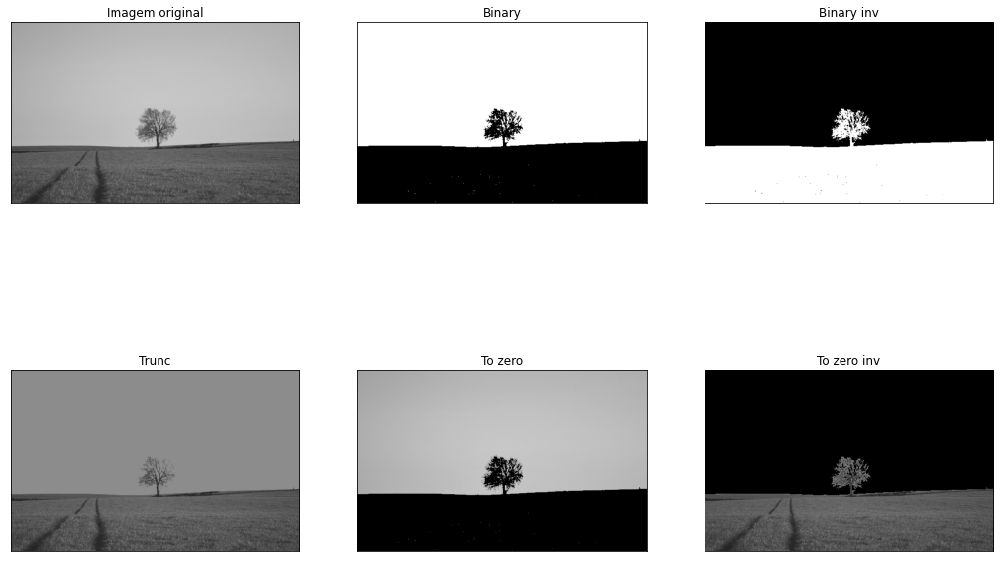

In [ ]:
exibir_limiarizacao(gray, limiar)

#### Exemplo com tomografia computadorizada

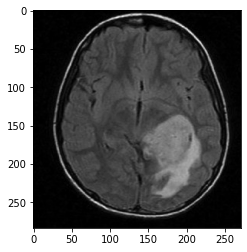

In [ ]:
img = cv2.imread('/content/imagens/ct-scan.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
plt.imshow(gray, cmap = 'gray');

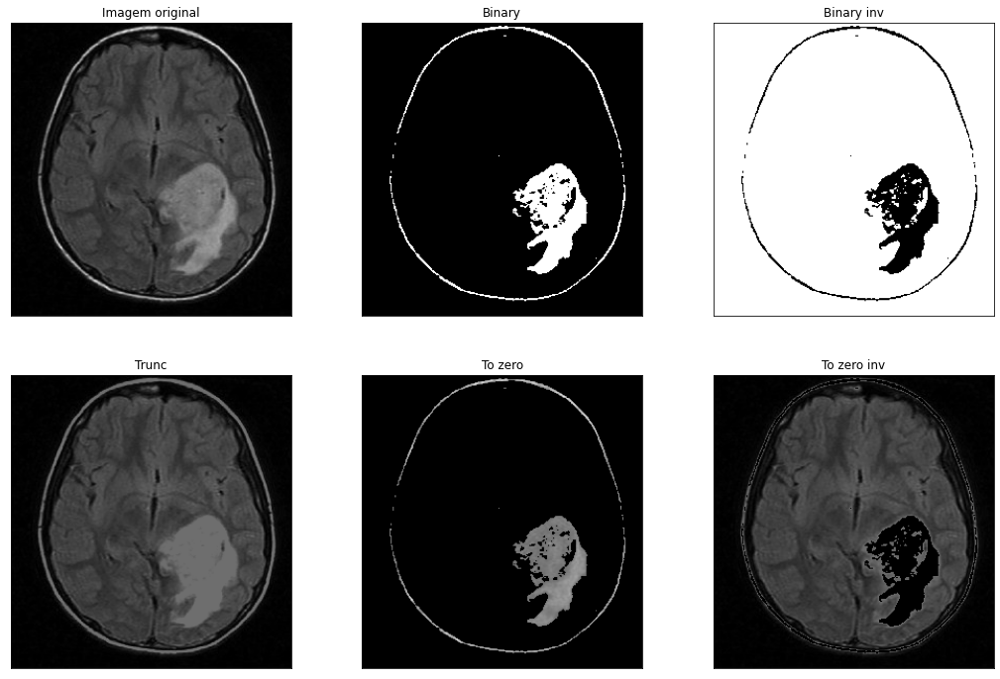

In [ ]:
limiar = 110
exibir_limiarizacao(gray, limiar)

#### Exemplo com imagem térmica infravermelha

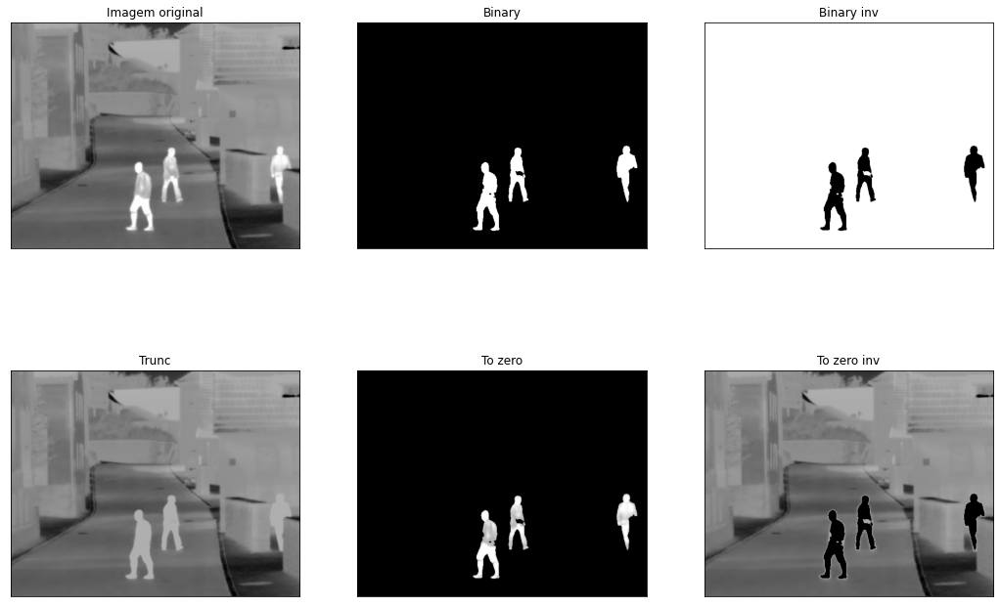

In [ ]:
img = cv2.imread("imagens/thermal01.jpg")
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
limiar = 175 #@param {type:"slider", min:0, max:255, step:1}
exibir_limiarizacao(gray, limiar)

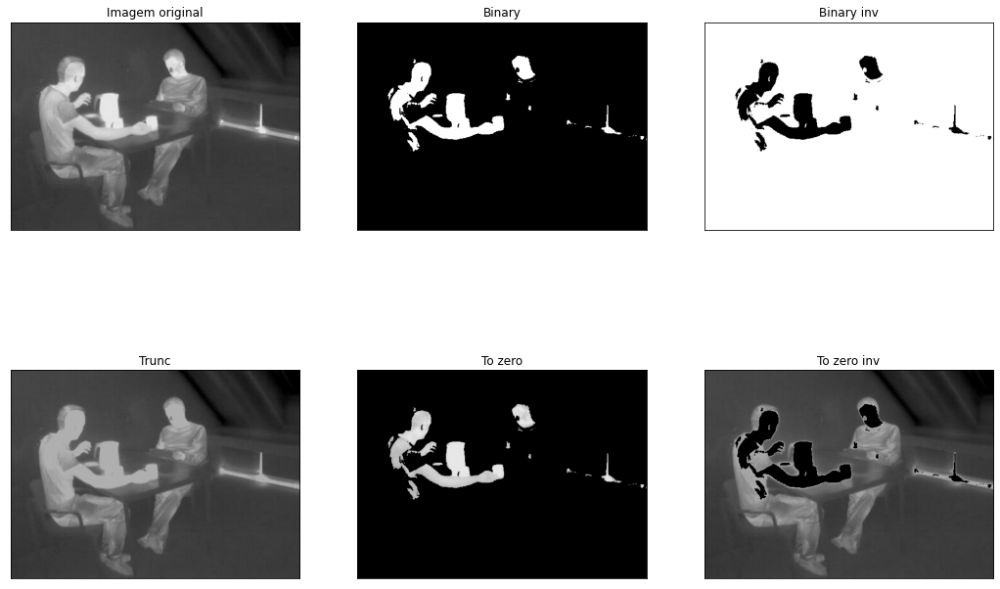

In [ ]:
img = cv2.imread("imagens/thermal02.jpg")
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
limiar = 175 #@param {type:"slider", min:0, max:255, step:1}
exibir_limiarizacao(gray, limiar)

#### Exemplo para separação do fundo do objeto

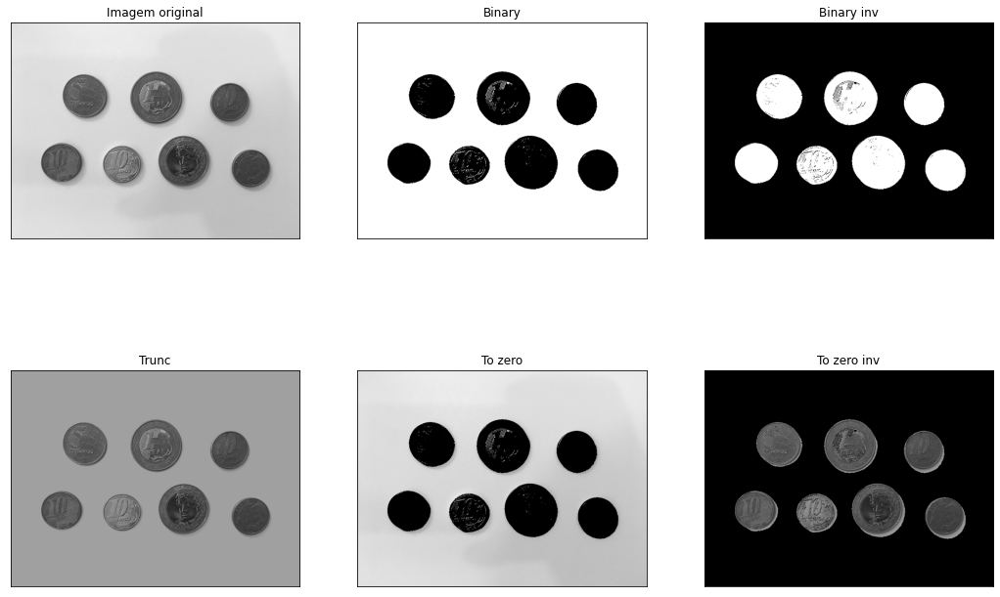

In [ ]:
img = cv2.imread("imagens/moedas01.jpg")
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
limiar = 160 #@param {type:"slider", min:0, max:255, step:1}
exibir_limiarizacao(gray, limiar)

## Método de Otsu (*Otsu's method*)

In [ ]:
img = cv2.imread('/content/imagens/paisagem01.jpg')
gray = cv2.cvtColor(rgb, cv2.COLOR_BGR2GRAY)

In [ ]:
valor, otsu = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)
print('Valor de limiar Otsu: ', valor)

Valor de limiar Otsu:  136.0


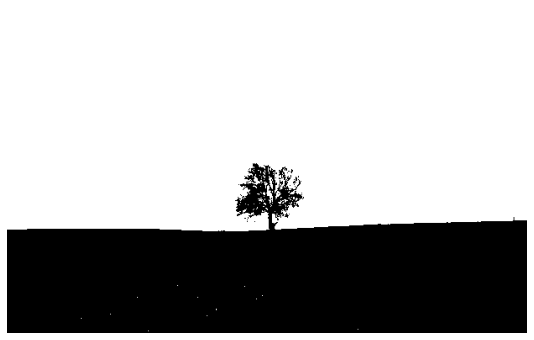

In [ ]:
mostrar(otsu)

### Histogramas

In [ ]:
histograma, bins = np.histogram(gray, 256, [0,256]) # 180, 255
histograma

array([   0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          3,    3,   15,   36,   54,   88,  127,  164,  205,  253,  231,
        201,  190,  214,  211,  220,  216,  239,  260,  254,  297,  329,
        399,  454,  475,  568,  645,  701,  775,  839,  957, 1077, 1136,
       1260, 1364, 1424, 1583, 1680, 1778, 1884, 1949, 2054, 2304, 2328,
       2452, 2512, 2630, 2590, 2607, 2563, 2580, 2583, 2418, 2406, 2354,
       2206, 2124, 2018, 1824, 1595, 1559, 1365, 1158, 1007,  865,  683,
        610,  508,  435,  364,  313,  245,  244,  200,  190,  140,  142,
        133,  130,   84,  122,   83,   88,   75,   90,   66,   62,   66,
         58,   62,   76,   52,   61,   69,   57,   52,   54,   53,   58,
         48,   54,   66,   48,   60,   66,   55,   55,   44,   59,   72,
         52,   59,   52,   54,   48,   53,   50,   

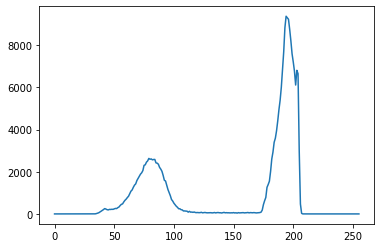

In [ ]:
plt.plot(histograma);

In [ ]:
gray.shape, gray.ravel().shape, 389 * 620

((389, 620), (241180,), 241180)

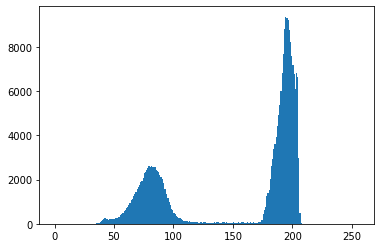

In [ ]:
plt.hist(gray.ravel(), 256, [0,256]);

### Melhorando a segmentação em imagens com ruído

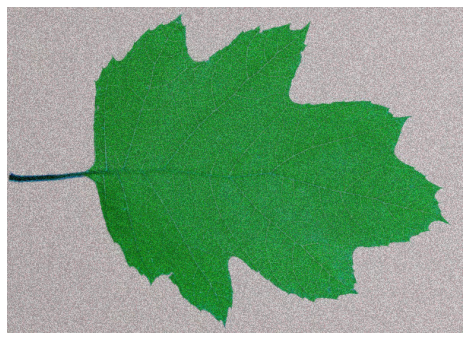

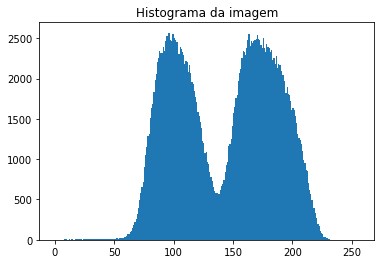

In [ ]:
img = cv2.imread('/content/imagens/folha_ruido.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
mostrar(img)
plt.hist(gray.ravel(), 256, [0,256])
fig.set_size_inches(12,6)
plt.title('Histograma da imagem')
plt.show()

Valor do limiar:  139.0


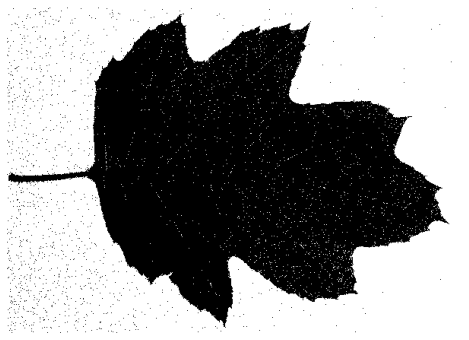

In [ ]:
valor, otsu = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)
print('Valor do limiar: ', valor)
mostrar(otsu)

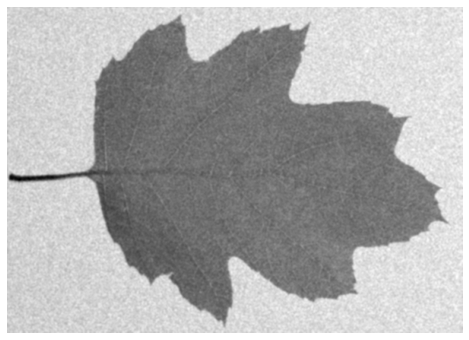

In [ ]:
desfoque = cv2.GaussianBlur(gray, (5,5), 0)
mostrar(desfoque)

Valor do limiar:  139.0


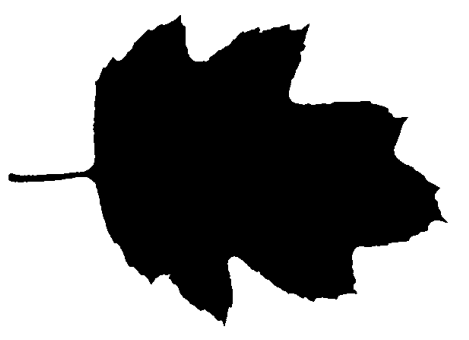

In [ ]:
valor, otsu = cv2.threshold(desfoque, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)
print('Valor do limiar: ', valor)
mostrar(otsu)

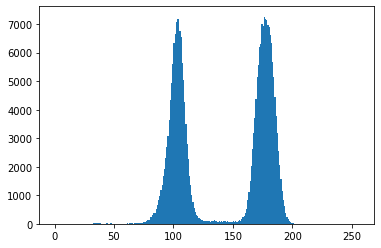

In [ ]:
plt.hist(desfoque.ravel(),256,[0,256]);

## Limiarização adaptativa

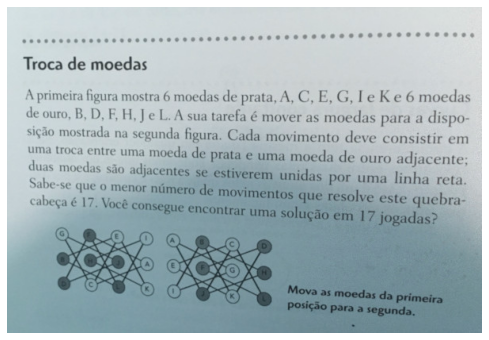

In [ ]:
img = cv2.imread('/content/imagens/livro-texto.jpg')
mostrar(img)

175.0


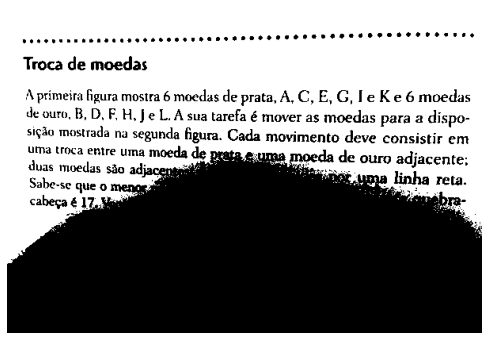

In [ ]:
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
valor, otsu = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)
print(valor)
mostrar(otsu)

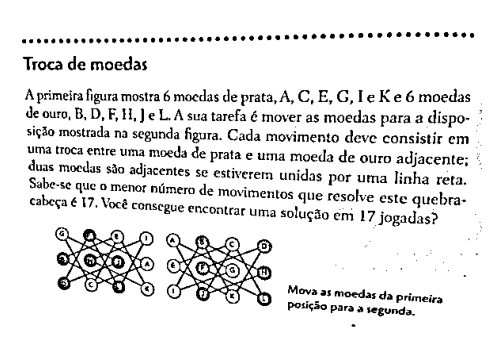

In [ ]:
adapt_media = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 9)
mostrar(adapt_media)

### Limiarização adaptativa Gaussiana

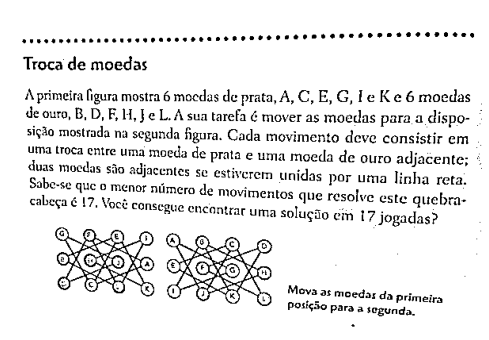

In [ ]:
adapt_gauss = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 9)
mostrar(adapt_gauss)

In [ ]:
def limiarizacao_adaptativa(img, limiar = 140, block_size = 11, C = 9):
  _, limiar_global = cv2.threshold(img, limiar, 255, cv2.THRESH_BINARY)
  limiar_media = cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, block_size, C)
  limiar_gauss = cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, block_size, C)

  imagens = [img, limiar_global, limiar_media, limiar_gauss]
  titulos = ['Imagem original', 'Limiarização global', 'Limiarização adaptativa - média', 'Limiarização adaptativa - gaussina']

  fig = plt.gcf()
  fig.set_size_inches(18,12)
  
  for i in range(4):
    plt.subplot(2,2,i+1)
    plt.imshow(cv2.cvtColor(imagens[i], cv2.COLOR_BGR2RGB), cmap='gray')
    plt.title(titulos[i])
    plt.xticks([]),plt.yticks([])

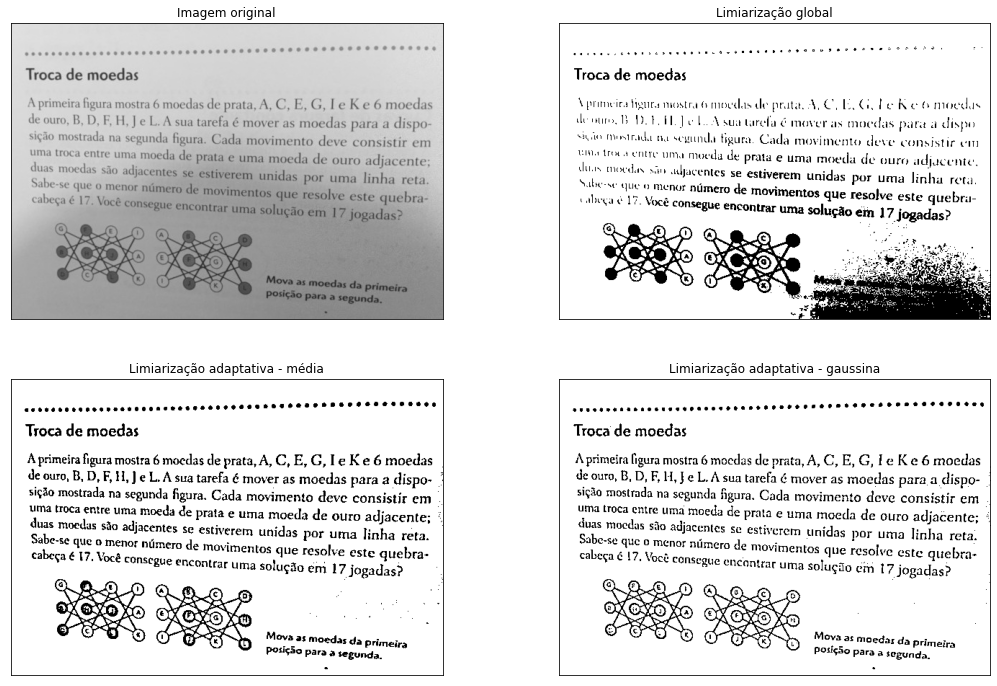

In [ ]:
limiarizacao_adaptativa(gray)

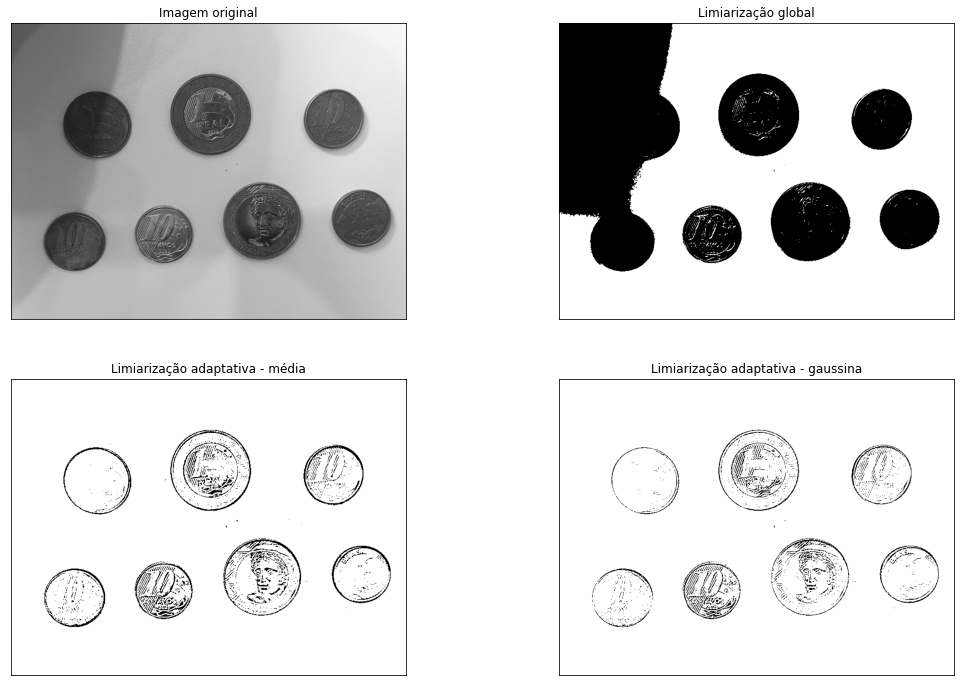

In [ ]:
img = cv2.imread('imagens/moedas02.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
limiarizacao_adaptativa(gray, C = 15)

### Segmentação com contornos

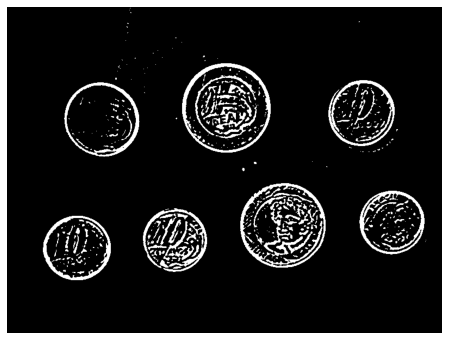

In [ ]:
img_processada = img.copy()
desfoque = cv2.GaussianBlur(gray, (7,7), 0)
adapt_gauss = cv2.adaptiveThreshold(desfoque, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 15, 3)
mostrar(adapt_gauss)

In [ ]:
kernel = np.ones((3,3), np.uint8)
kernel

array([[1, 1, 1],
       [1, 1, 1],
       [1, 1, 1]], dtype=uint8)

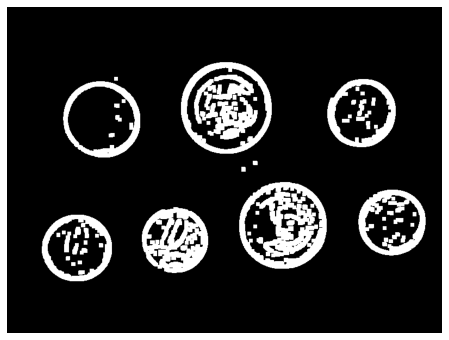

In [ ]:
erosao = cv2.erode(adapt_gauss, kernel)
dilatacao = cv2.dilate(erosao, kernel, iterations=3)
mostrar(dilatacao)

In [ ]:
elementos = dilatacao.copy()
contornos, hierarquia = cv2.findContours(elementos, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

In [ ]:
print(contornos)

12384.0
11397.5
11720.0
20261.5
15545.0
12289.5
22212.0


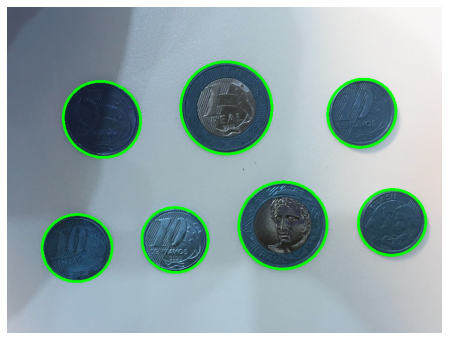

In [ ]:
img_processada = img.copy()
for cnt in contornos:
  area = cv2.contourArea(cnt)
  if area >= 1000:
    print(area)
    elipse = cv2.fitEllipse(cnt)
    cv2.ellipse(img_processada, elipse, (0,255,0), 3)
mostrar(img_processada)

### Sobreposição com limiar adaptativo

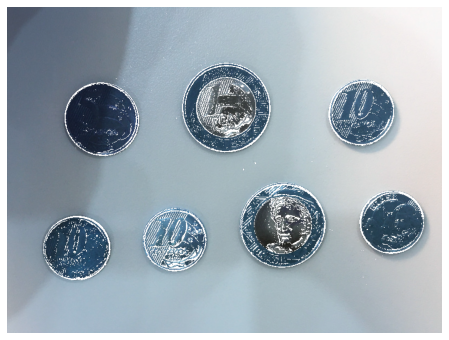

In [ ]:
adapt_gauss = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 15, 11)
sobrepor = cv2.add(img, cv2.cvtColor(adapt_gauss, cv2.COLOR_GRAY2BGR))
mostrar(sobrepor)

# Segmentação baseada em bordas

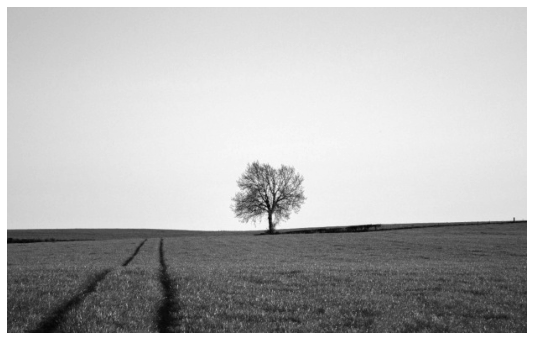

In [ ]:
img = cv2.imread('imagens/paisagem01.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
mostrar(gray)

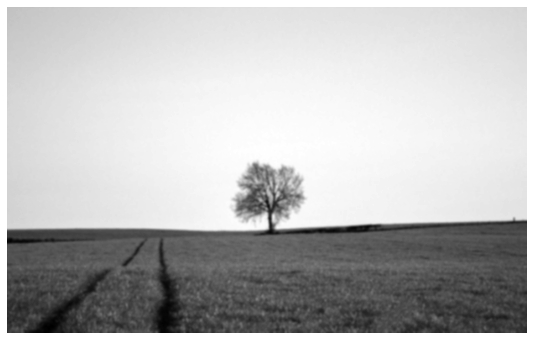

In [ ]:
desfoque = cv2.GaussianBlur(gray, (5,5), 0)
mostrar(desfoque)

## Sobel

In [ ]:
# Primeira maneira
k_sobelX = np.array(([-1, 0, 1],
                     [-2, 0, 2],
                     [-1, 0, 1]), np.float32)
k_sobelY = np.array(([-1, -2, -1],
                     [0, 0, 0],
                     [1, 2, 1]), np.float32)
sobel_x = cv2.filter2D(desfoque, cv2.CV_64F, k_sobelX)
sobel_y = cv2.filter2D(desfoque, cv2.CV_64F, k_sobelY)

In [ ]:
# Segunda maneira
sobel_x = cv2.Sobel(desfoque, cv2.CV_64F, 1, 0, ksize = 3)
sobel_y = cv2.Sobel(desfoque, cv2.CV_64F, 0, 1, ksize = 3)

In [ ]:
sobel_x = cv2.convertScaleAbs(sobel_x)
sobel_y = cv2.convertScaleAbs(sobel_y)

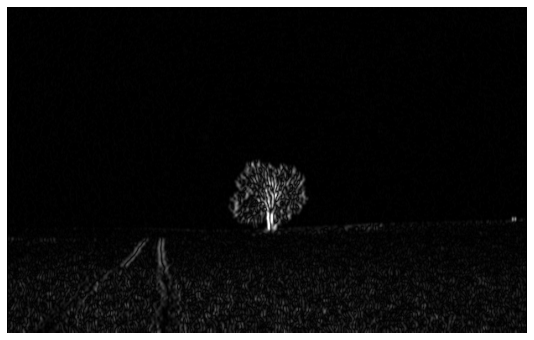

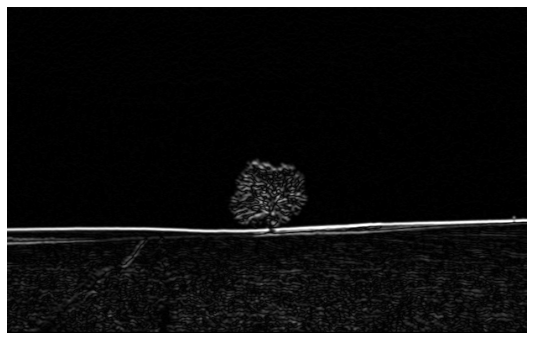

In [ ]:
mostrar(sobel_x)
mostrar(sobel_y)

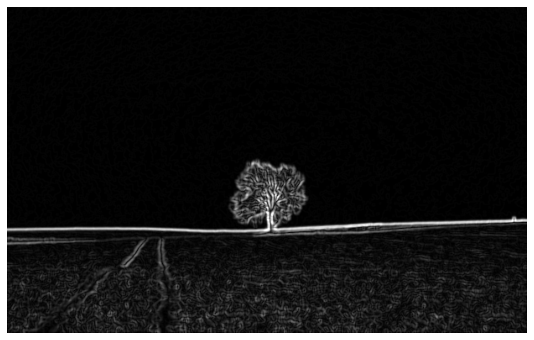

In [ ]:
sobel = cv2.addWeighted(src1 = sobel_x, alpha=0.5, src2 = sobel_y, beta = 0.5, gamma = 100)
mostrar(sobel)

## Canny Edge

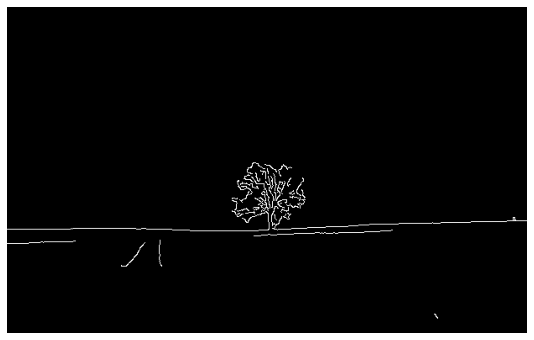

In [ ]:
canny = cv2.Canny(desfoque, 80, 140)
mostrar(canny)

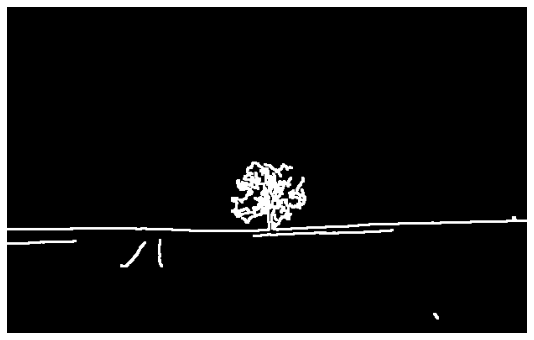

In [ ]:
dilatacao = cv2.dilate(canny, np.ones((3,3), np.uint8))
mostrar(dilatacao)

In [ ]:
def segmentacao_bordas(img):
  desfoque = cv2.GaussianBlur(img, (5, 5), 0)
  
  sobel_x = cv2.Sobel(desfoque, cv2.CV_64F, 1, 0, ksize=3)
  sobel_y = cv2.Sobel(desfoque, cv2.CV_64F, 0, 1, ksize=3)
  sobel_x = cv2.convertScaleAbs(sobel_x)
  sobel_y = cv2.convertScaleAbs(sobel_y)
  sobel = cv2.addWeighted(src1=sobel_x, alpha=0.5, src2=sobel_y, beta=0.5, gamma=0)

  canny = cv2.Canny(desfoque, 80, 140)

  kernel = np.ones((3, 3), np.uint8)
  dilatacao = cv2.dilate(canny, kernel, iterations=2)
  erosao = cv2.erode(dilatacao, kernel, iterations=1)

  imagens = [img, sobel, canny, erosao]
  titulos = ['Imagem Original', 'Sobel', 'Canny Edge', 'Canny Edge + Fechamento']

  fig = plt.gcf()
  fig.set_size_inches(18, 12)

  for i in range(4):
      plt.subplot(2,2,i+1)
      plt.imshow(cv2.cvtColor(imagens[i], cv2.COLOR_BGR2RGB), 'gray')
      plt.title(titulos[i])
      plt.xticks([]),plt.yticks([]) 
      plt.subplots_adjust(wspace=0.1) 

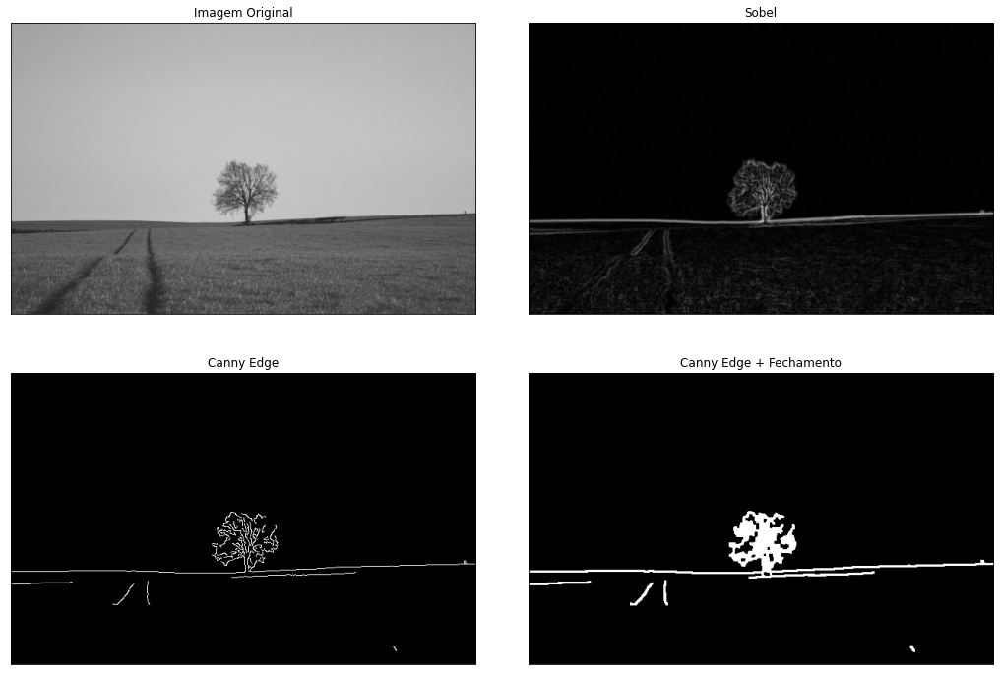

In [ ]:
segmentacao_bordas(gray)

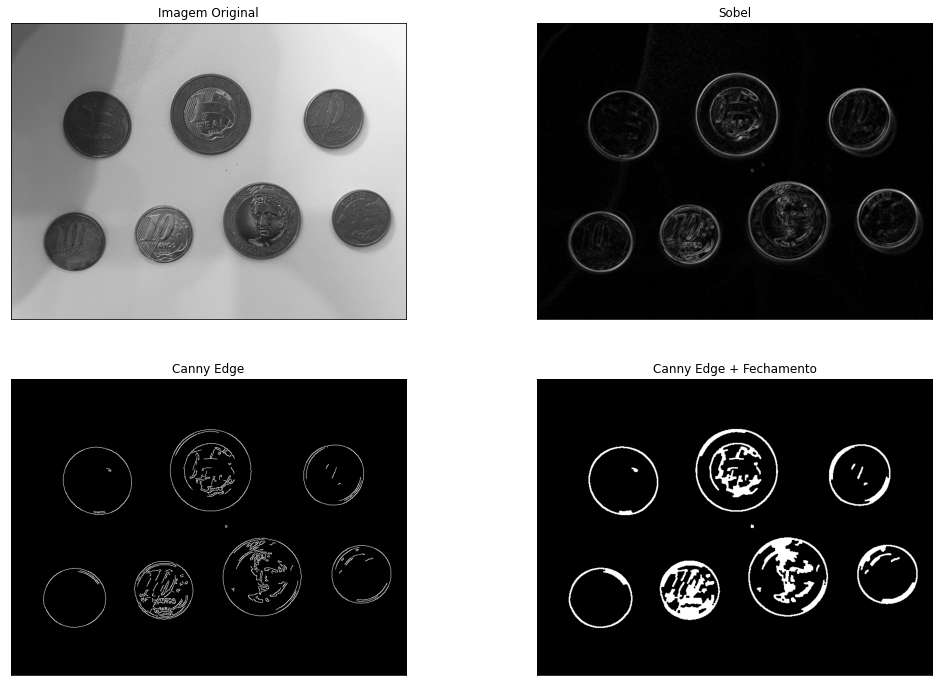

In [ ]:
img = cv2.imread("imagens/moedas02.jpg")
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
segmentacao_bordas(gray)

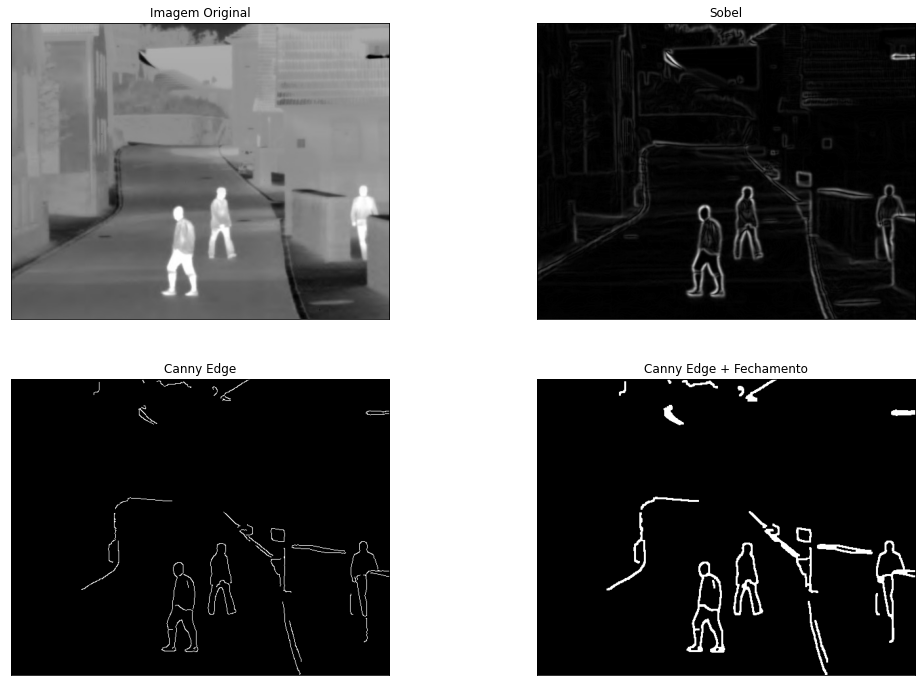

In [ ]:
img = cv2.imread("imagens/thermal01.jpg")
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
segmentacao_bordas(gray)

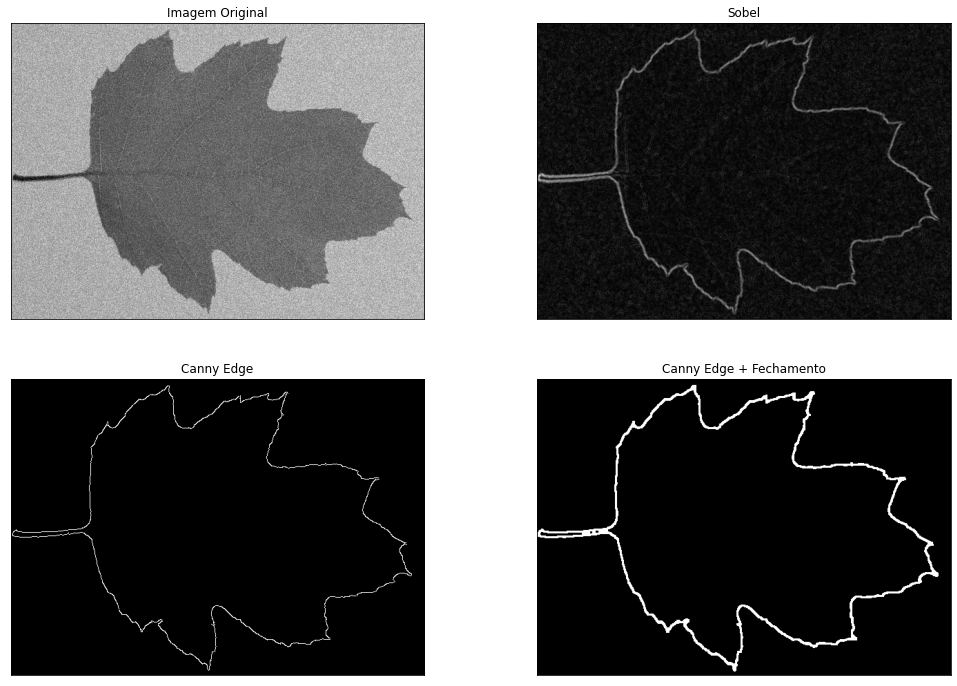

In [ ]:
img = cv2.imread("imagens/folha_ruido.jpg")
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
segmentacao_bordas(gray)

## Preenchimento das detecções

### Fechamento

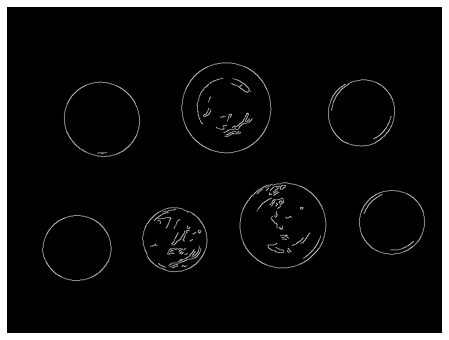

In [ ]:
img = cv2.imread("imagens/moedas02.jpg")
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
desfoque = cv2.GaussianBlur(gray, (7, 7), 0)
canny = cv2.Canny(desfoque, 80, 140)
mostrar(canny)

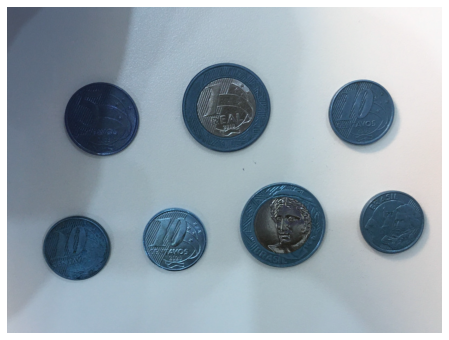

In [ ]:
mostrar(img)

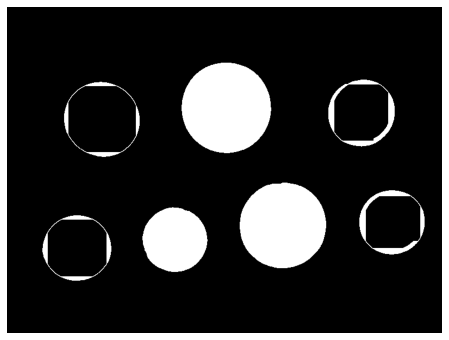

In [ ]:
kernel = np.ones((5, 5), np.uint8)
dilatacao = cv2.dilate(canny, kernel, iterations=14)
erosao = cv2.erode(dilatacao, kernel, iterations=14)
mostrar(erosao)

### Detecção de contornos

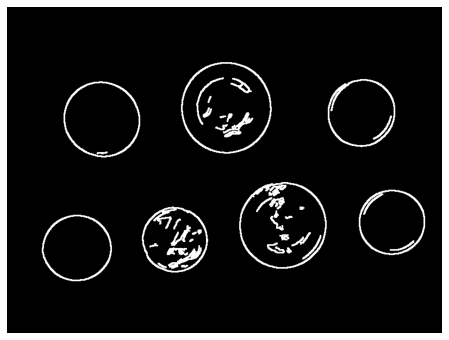

In [ ]:
dilatacao = cv2.dilate(canny, np.ones((3, 3), np.uint8), iterations=1)
mostrar(dilatacao)

In [ ]:
contornos, hierarquia = cv2.findContours(dilatacao, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)

In [ ]:
img.shape, img.shape[0], img.shape[1]

((600, 800, 3), 600, 800)

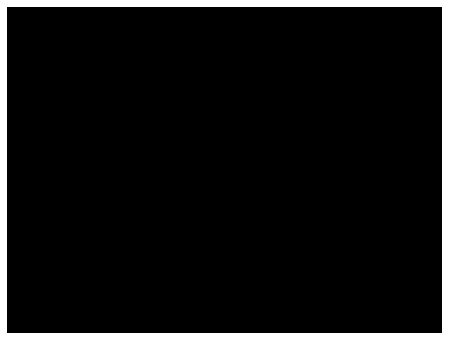

In [ ]:
mascara = np.zeros((img.shape[0], img.shape[1]), dtype = np.uint8)
mostrar(mascara)

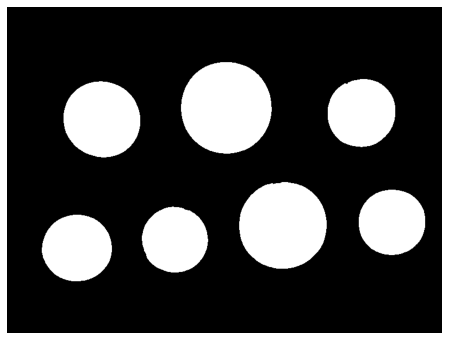

In [ ]:
cv2.drawContours(mascara, contornos, -1, color = (255,255,255), thickness=cv2.FILLED)
mostrar(mascara)

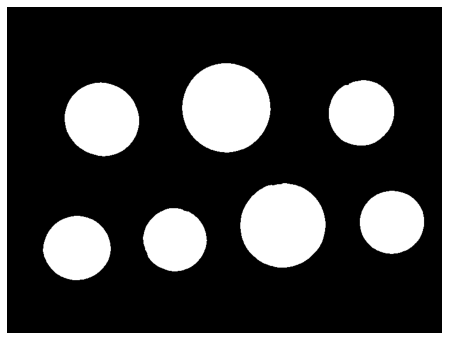

In [ ]:
mascara = cv2.erode(mascara, np.ones((3,3), np.uint8), iterations=2)
mostrar(mascara)

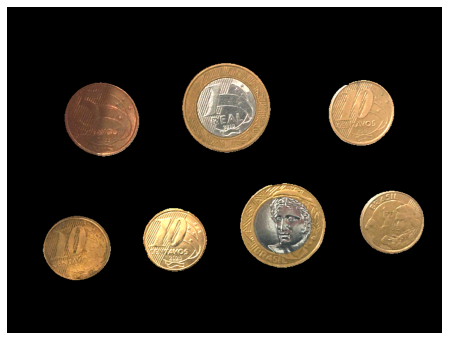

In [ ]:
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img_final = cv2.add(img, img, mask=mascara)
mostrar(img_final)

# Mascaramento de imagem

In [ ]:
img = cv2.imread('imagens/paisagem01.jpg')
img.shape

(389, 620, 3)

In [ ]:
altura, largura = img.shape[:2]
altura, largura

(389, 620)

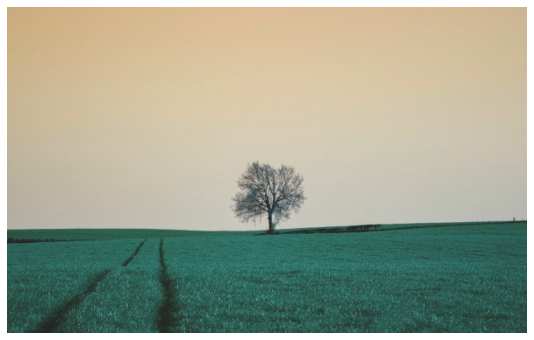

In [ ]:
mostrar(img)

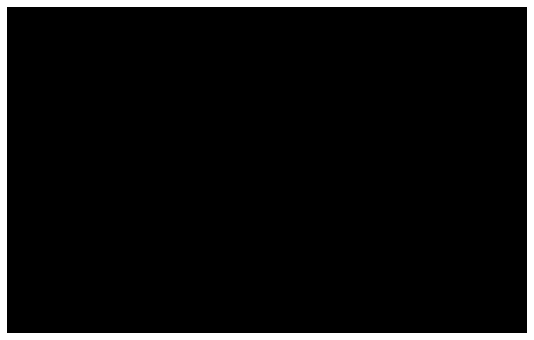

In [ ]:
mascara = np.zeros((altura, largura), dtype='uint8')
mostrar(mascara)

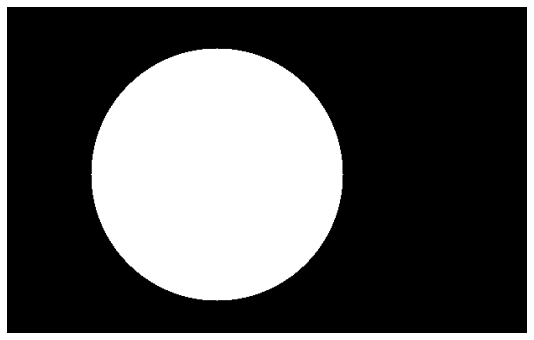

In [ ]:
cv2.circle(mascara, (250, 200), 150, 255, -1)
mostrar(mascara)

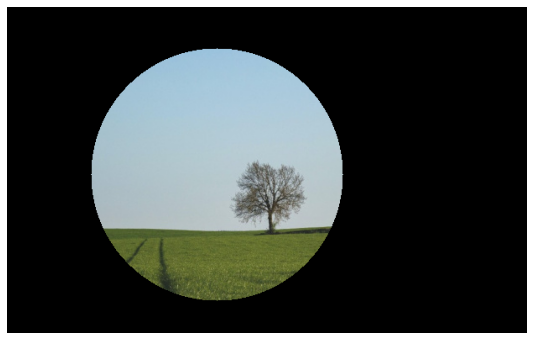

In [ ]:
img_final = cv2.bitwise_and(cv2.cvtColor(img, cv2.COLOR_BGR2RGB), cv2.cvtColor(img, cv2.COLOR_BGR2RGB), mask=mascara)
mostrar(img_final)

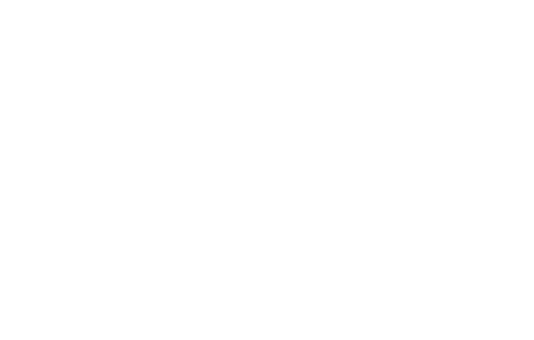

In [ ]:
fundo_branco = 255 * np.ones((altura, largura, 3), dtype='uint8')
mostrar(fundo_branco)

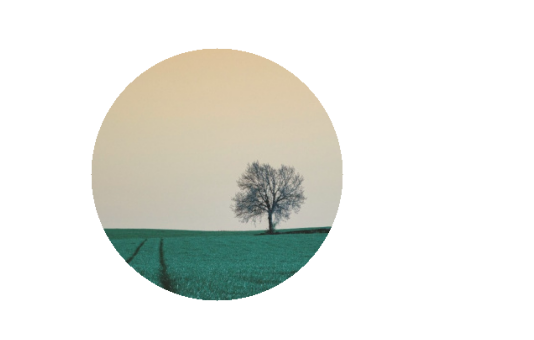

In [ ]:
img_final = img.copy()
img_final[mascara == 0] = fundo_branco[mascara == 0]
mostrar(img_final)

In [ ]:
fundo = cv2.imread('imagens/montanha.jpg')
fundo.shape

(750, 1180, 3)

In [ ]:
fundo = cv2.resize(fundo, (largura, altura))
fundo.shape

(389, 620, 3)

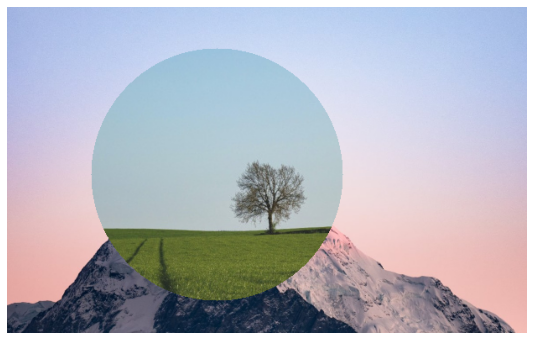

In [ ]:
img_final[mascara == 0] = fundo[mascara == 0]
mostrar(cv2.cvtColor(img_final, cv2.COLOR_BGR2RGB))

## Isolando o objeto

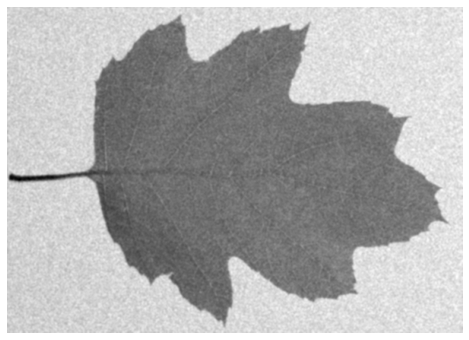

In [ ]:
img = cv2.imread("imagens/folha_ruido.jpg")
altura, largura = img.shape[:2]
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
desfoque = cv2.GaussianBlur(gray, (5, 5), 0)
mostrar(desfoque)

139.0


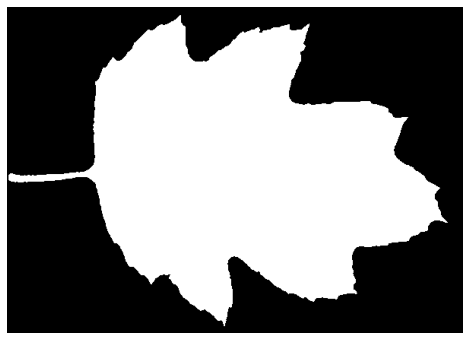

In [ ]:
valor, mascara = cv2.threshold(desfoque, 0, 255, cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)
print(valor)
mostrar(mascara)

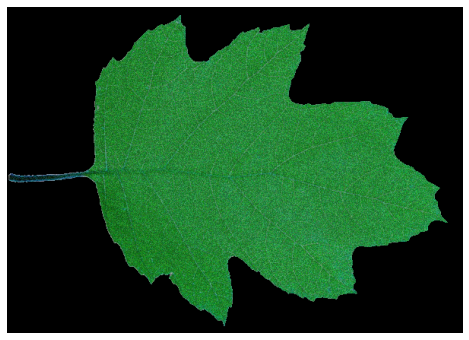

In [ ]:
img_final = cv2.bitwise_and(img, img, mask=mascara)
mostrar(img_final)

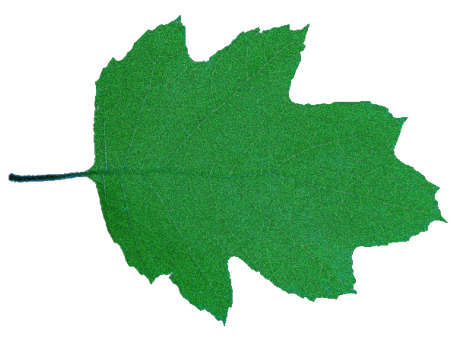

In [ ]:
fundo_branco = 255 * np.ones((altura, largura, 3), dtype='uint8')
img_final = img.copy()
img_final[mascara == 0] = fundo_branco[mascara == 0]
mostrar(img_final)

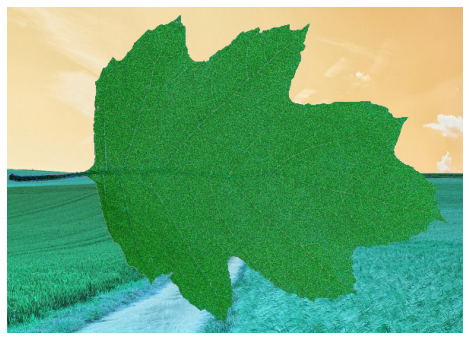

In [ ]:
fundo = cv2.imread("imagens/paisagem03.jpg")
fundo = cv2.resize(fundo, (largura, altura))
img_final[mascara == 0] = fundo[mascara == 0]
mostrar(img_final)

# Segmentação baseada em região

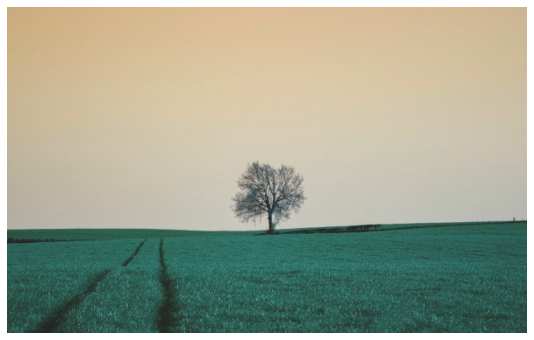

In [ ]:
img = cv2.imread('imagens/paisagem01.jpg')
mostrar(img)

In [ ]:
img.shape

(389, 620, 3)

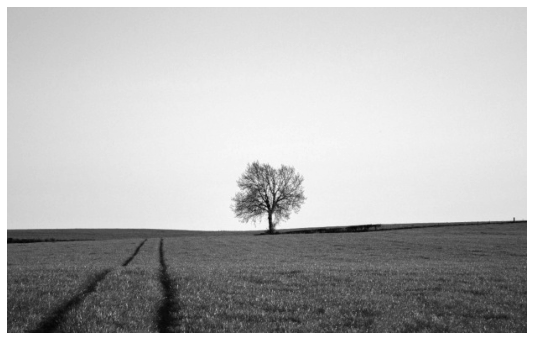

In [ ]:
altura, largura = img.shape[0], img.shape[1]
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
mostrar(gray)

In [ ]:
img

In [ ]:
389 * 620

241180

In [ ]:
img_flat = gray.reshape(altura * largura)
print(img_flat)
print(img_flat.shape)

[156 158 159 ...  66  60  62]
(241180,)


In [ ]:
media = img_flat.mean()
media

152.5262874201841

In [ ]:
num_pixels = len(img_flat)
num_pixels

241180

In [ ]:
for i in range(num_pixels):
  if img_flat[i] > media:
    img_flat[i] = 255
  else:
    img_flat[i] = 0

In [ ]:
img_flat

array([255, 255, 255, ...,   0,   0,   0], dtype=uint8)

In [ ]:
seg_regiao = img_flat.reshape(altura, largura)
seg_regiao.shape

(389, 620)

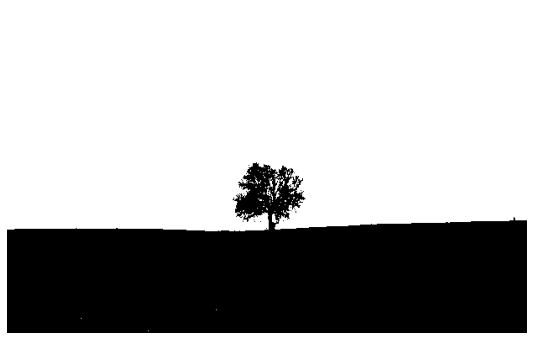

In [ ]:
mostrar(seg_regiao)

In [ ]:
def flatten_img(img):
  altura, largura = img.shape[0], img.shape[1]
  img_flat = img.reshape(altura * largura)
  return img_flat

In [ ]:
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
img_flat = flatten_img(gray)
print(img_flat)
print(img_flat.shape)
print('Média: ' + str(img_flat.mean()))

[156 158 159 ...  66  60  62]
(241180,)
Média: 152.5262874201841


In [ ]:
from skimage.color import rgb2gray

In [ ]:
gray = rgb2gray(img)
img_flat = flatten_img(gray)
print(img_flat)
print(img_flat.shape)
print('Média: ' + str(img_flat.mean()))

[0.6640902  0.67193333 0.6758549  ... 0.2539749  0.23211216 0.23995529]
(241180,)
Média: 0.6144771479539324


## 2 regiões

In [ ]:
def segmenta2regioes(img):
  pixels = flatten_img(img).copy()
  media = pixels.mean()
  for i in range(len(pixels)):
    if pixels[i] > media:
      pixels[i] = 255
    else:
      pixels[i] = 0
  seg_regiao = pixels.reshape(img.shape[0], img.shape[1])
  return seg_regiao

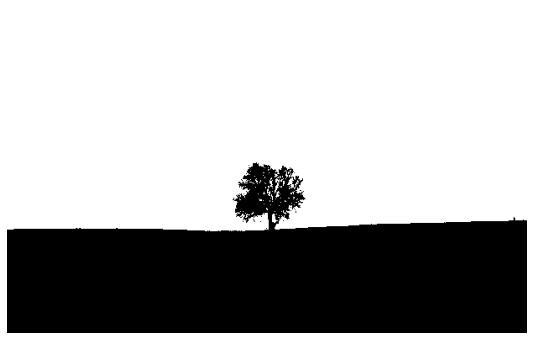

In [ ]:
seg_regiao = segmenta2regioes(gray)
mostrar(seg_regiao)

## 3 regiões

In [ ]:
1 / 3 # 0 - 0.33 0.34 - 0.66 - 0.67 - 1.0

0.3333333333333333

In [ ]:
def segmenta3regioes(img):
  pixels = flatten_img(img).copy()
  for i in range(len(pixels)):
    if pixels[i] > 0.66:
      pixels[i] = 2
    elif pixels[i] > 0.33:
      pixels[i] = 1
    else:
      pixels[i] = 0
  seg_regiao = pixels.reshape(img.shape[0], img.shape[1])
  return seg_regiao

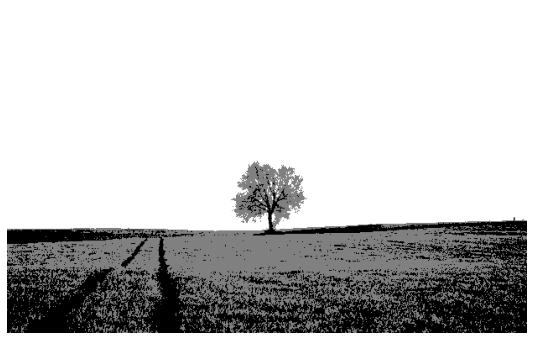

In [ ]:
seg_regiao = segmenta3regioes(gray)
mostrar(seg_regiao)

## 4 regiões

In [ ]:
1 / 4

0.25

In [ ]:
def segmenta4regioes(img):
  pixels = flatten_img(img).copy()
  for i in range(len(pixels)):
    if pixels[i] > 0.75:
      pixels[i] = 3
    elif pixels[i] > 0.5:
      pixels[i] = 2
    elif pixels[i] > 0.25:
      pixels[i] = 1
    else:
      pixels[i] = 0
  seg_regiao = pixels.reshape(img.shape[0], img.shape[1])
  return seg_regiao

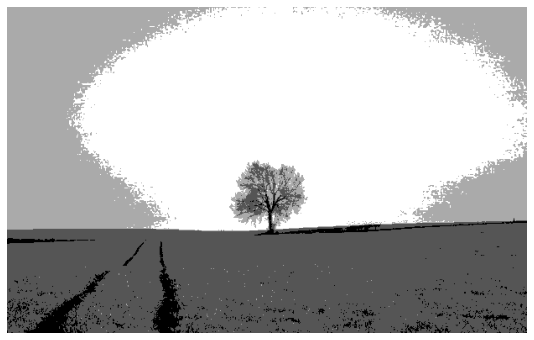

In [ ]:
seg_regiao = segmenta4regioes(gray)
mostrar(seg_regiao)

## 5 regiões

In [ ]:
1 / 5

0.2

In [ ]:
def segmenta5regioes(img):
  pixels = flatten_img(img).copy()
  for i in range(len(pixels)):
    if pixels[i] > 0.8:
      pixels[i] = 4
    elif pixels[i] > 0.6:
      pixels[i] = 3
    elif pixels[i] > 0.4:
      pixels[i] = 2
    elif pixels[i] > 0.2:
      pixels[i] = 1
    else:
      pixels[i] = 0
  seg_regiao = pixels.reshape(img.shape[0], img.shape[1])
  return seg_regiao

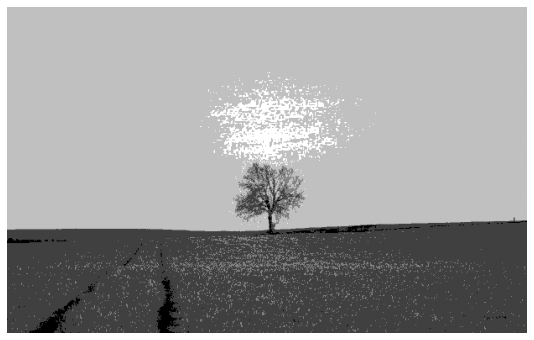

In [ ]:
seg_regiao = segmenta5regioes(gray)
mostrar(seg_regiao)

In [ ]:
def segmentacao_regiao(img, cmap='gray'):
  original = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  gray = rgb2gray(img)
  segment2R = segmenta2regioes(gray)
  segment3R = segmenta3regioes(gray)
  segment4R = segmenta4regioes(gray)
  segment5R = segmenta5regioes(gray)
  
  titulos = ['Imagem Original', '2 Regiões', '3 Regiões', '4 Regiões', '5 Regiões', 'Original (1 canal)']
  imagens = [original, segment2R, segment3R, segment4R, segment5R, gray]

  fig = plt.gcf()
  fig.set_size_inches(18, 10)  
  for i in range(6):
      plt.subplot(2,3,i+1)
      plt.imshow(imagens[i], cmap) 
      plt.title(titulos[i]) 
      plt.xticks([]),plt.yticks([])
      
  plt.subplots_adjust(wspace=0.05)
  plt.show()

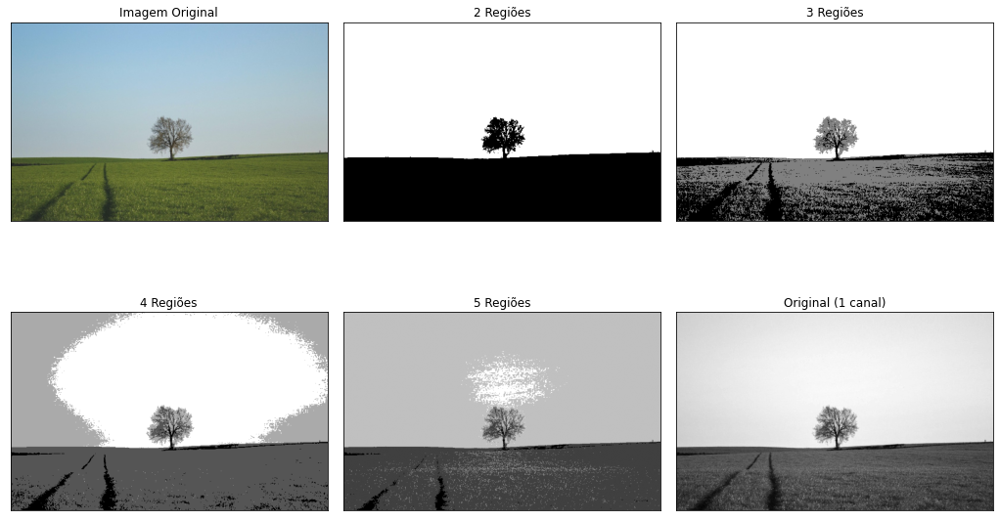

In [ ]:
img = cv2.imread('imagens/paisagem01.jpg')
segmentacao_regiao(img)

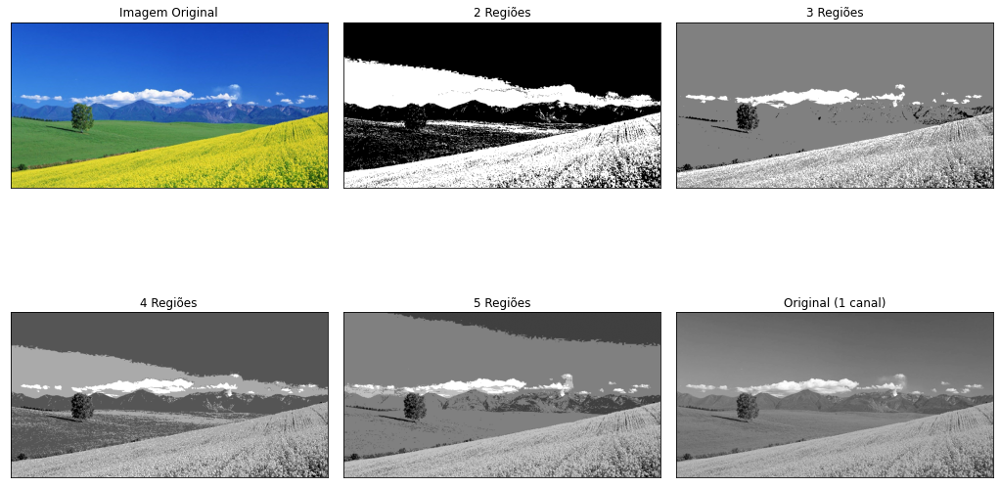

In [ ]:
img = cv2.imread('imagens/paisagem02.jpg')
segmentacao_regiao(img)

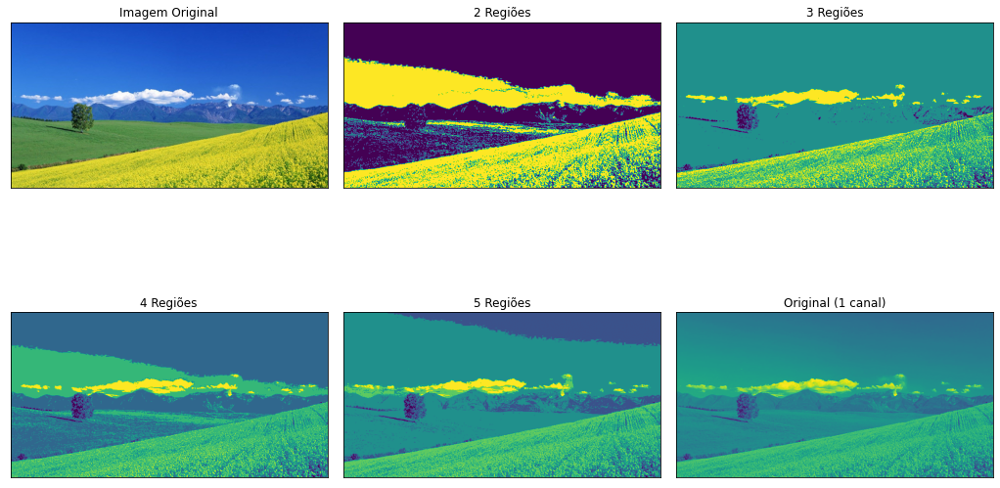

In [ ]:
# Mais cmaps: https://matplotlib.org/stable/tutorials/colors/colormaps.html*
img = cv2.imread("imagens/paisagem02.jpg")
segmentacao_regiao(img, cmap="viridis")

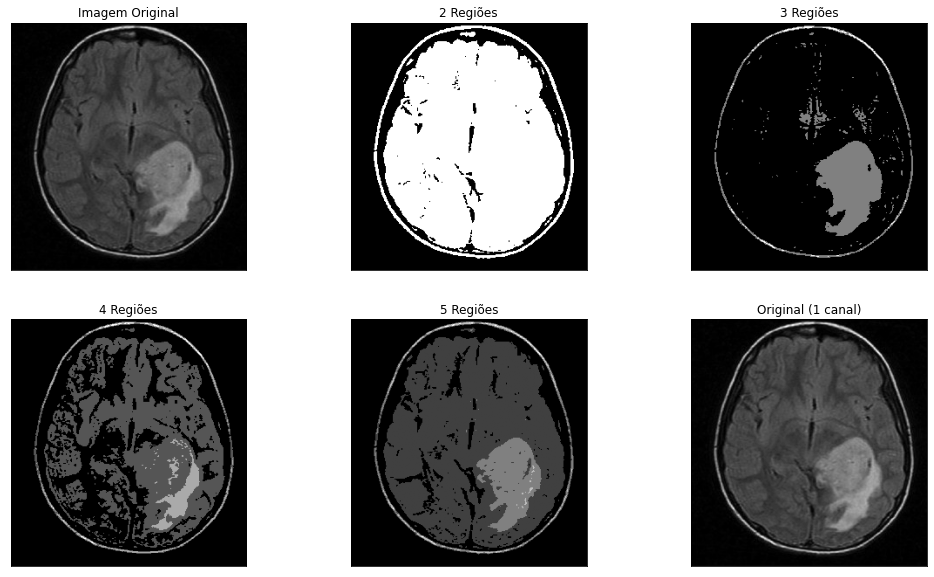

In [ ]:
img = cv2.imread("imagens/ct-scan.jpg")
segmentacao_regiao(img)

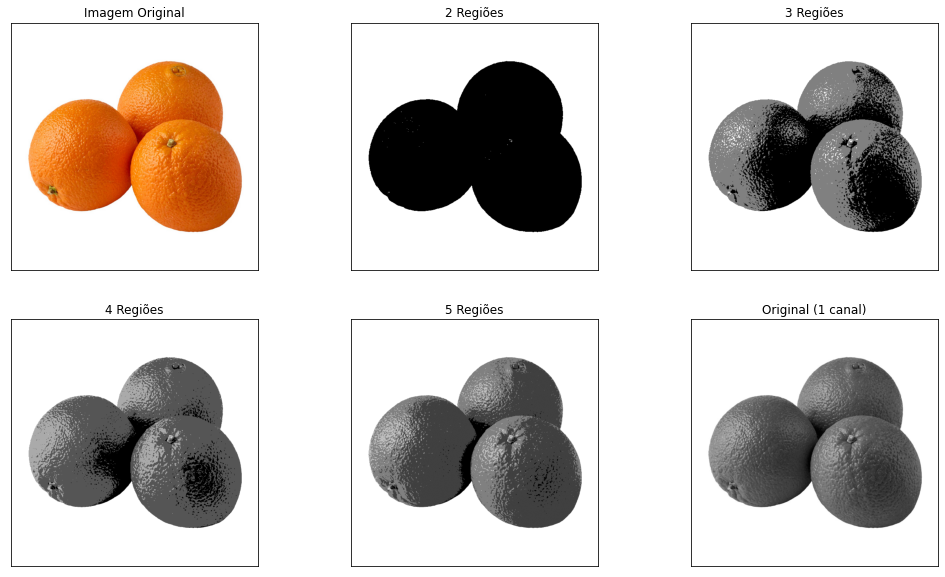

In [ ]:
img = cv2.imread("imagens/laranjas.jpg")
segmentacao_regiao(img)

# Segmentação baseada em clusters

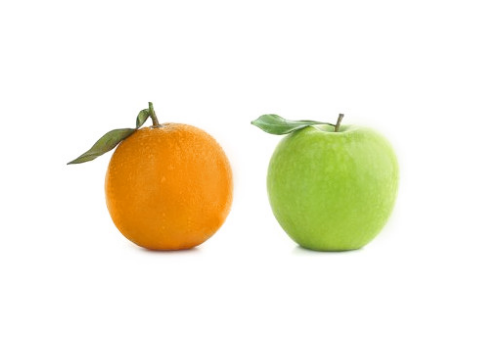

(334, 500, 3)

In [ ]:
img = cv2.imread('imagens/frutas.jpg')
mostrar(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
img.shape

In [ ]:
334 * 500

167000

In [ ]:
vetorizado = img.reshape((-1, 3))
vetorizado.shape

(167000, 3)

In [ ]:
vetorizado = np.float32(vetorizado)

In [ ]:
criterio = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 1.0)

In [ ]:
# https://opencv24-python-tutorials.readthedocs.io/en/latest/py_tutorials/py_ml/py_kmeans/py_kmeans_opencv/py_kmeans_opencv.html
ret, label, centros = cv2.kmeans(vetorizado, 3, None, criterio, 10, cv2.KMEANS_RANDOM_CENTERS)

In [ ]:
print(ret)

66691163.58572686


In [ ]:
print(label), len(label), np.unique(label)

[[2]
 [2]
 [2]
 ...
 [2]
 [2]
 [2]]


(None, 167000, array([0, 1, 2], dtype=int32))

In [ ]:
print(centros)

[[ 14.406983 133.79312  225.93048 ]
 [ 84.77781  190.10513  166.05893 ]
 [254.4694   255.06332  255.06282 ]]


In [ ]:
centros = np.uint8(centros)
centros

array([[ 14, 133, 225],
       [ 84, 190, 166],
       [254, 255, 255]], dtype=uint8)

In [ ]:
img_final = centros[label.flatten()]

In [ ]:
img_final[70000]

array([254, 255, 255], dtype=uint8)

In [ ]:
img_final.shape

(167000, 3)

In [ ]:
img_final = img_final.reshape(img.shape)
img_final.shape

(334, 500, 3)

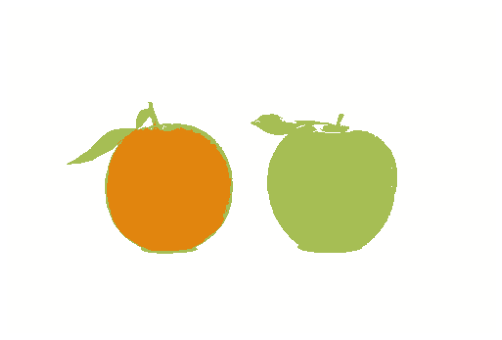

In [ ]:
mostrar(cv2.cvtColor(img_final, cv2.COLOR_BGR2RGB))

In [ ]:
def segmentacao_cluster(img, k):
  vetorizado = np.float32(img).reshape(-1,3)
  criterio = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER,20,1.0)
  ret,label,centros = cv2.kmeans(vetorizado, k , None, criterio,10,cv2.KMEANS_RANDOM_CENTERS)
  centros = np.uint8(centros)
  img_final = centros[label.flatten()]
  img_final = img_final.reshape(img.shape)
  return img_final

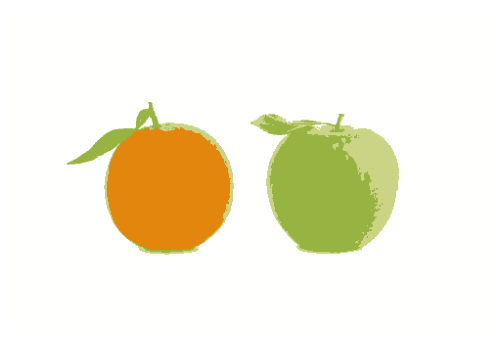

In [ ]:
seg_cluster = segmentacao_cluster(img, 4)
mostrar(seg_cluster)

In [ ]:
def segmentacao_clustering(img):
  titulos = ['Imagem original']
  imagens = [img]

  segmentacoes = 6
  for k in range(2, segmentacoes + 1):
    titulo = 'k = ' + str(k)
    titulos.append(titulo)
    seg = segmentacao_cluster(img, k)
    imagens.append(seg)

  fig = plt.gcf()
  fig.set_size_inches(18, 12)  
  for i in range(6):
      plt.subplot(2,3,i+1)
      plt.imshow(cv2.cvtColor(imagens[i], cv2.COLOR_BGR2RGB))
      plt.title(titulos[i]) 
      plt.xticks([]),plt.yticks([]) 
      
  plt.subplots_adjust(wspace=0.05)
  plt.show()

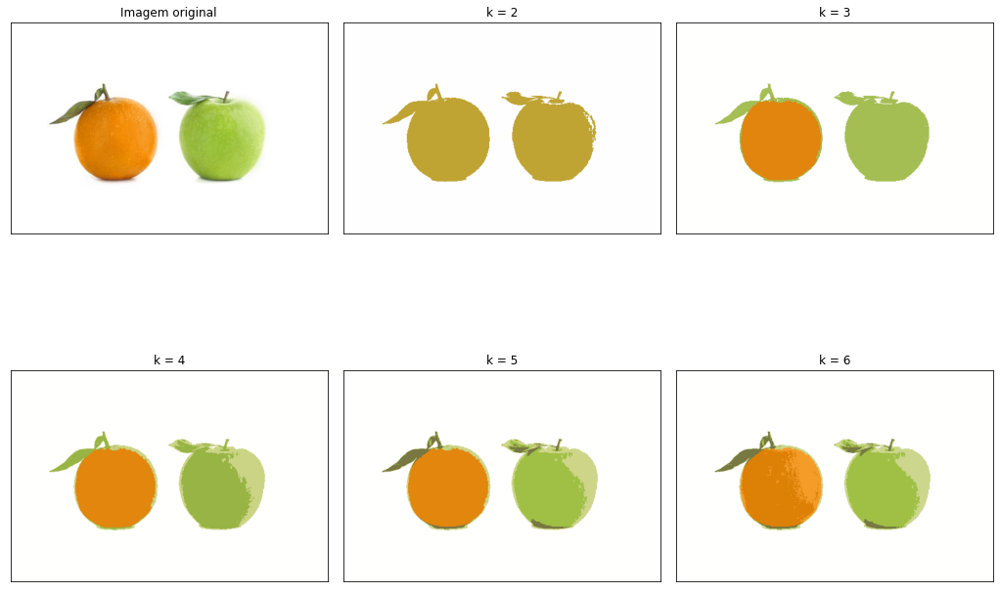

In [ ]:
segmentacao_clustering(img)

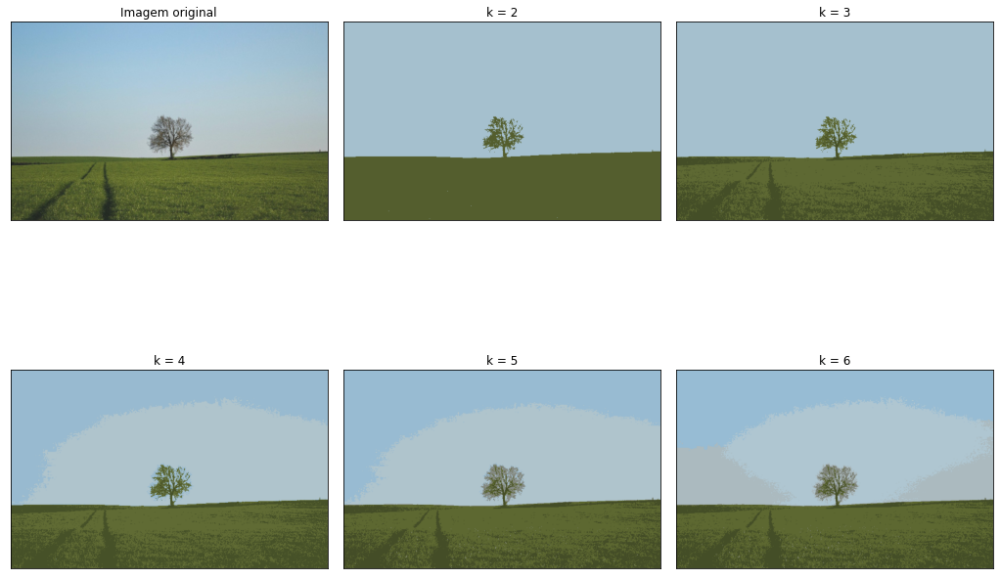

In [ ]:
img = cv2.imread("imagens/paisagem01.jpg")
segmentacao_clustering(img)

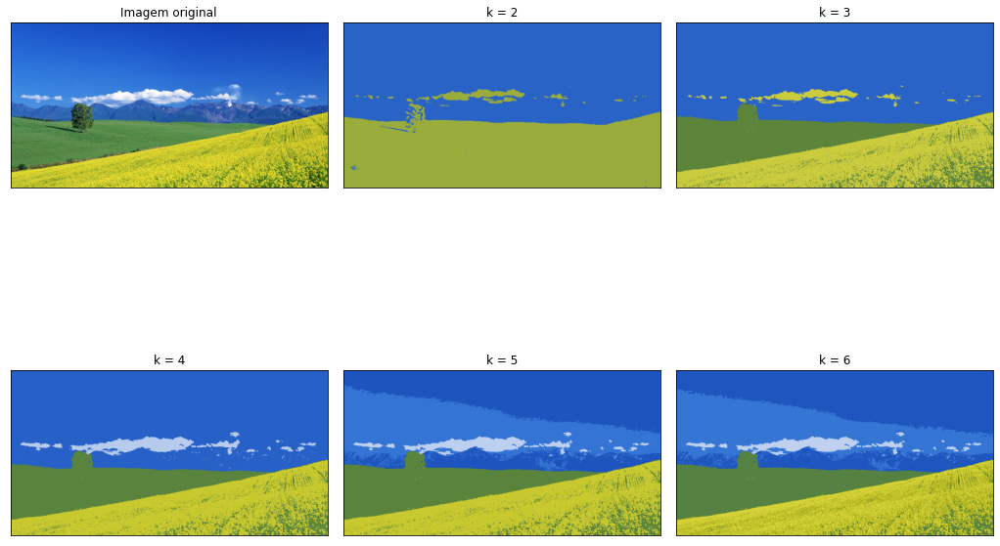

In [ ]:
img = cv2.imread("imagens/paisagem02.jpg")
segmentacao_clustering(img)

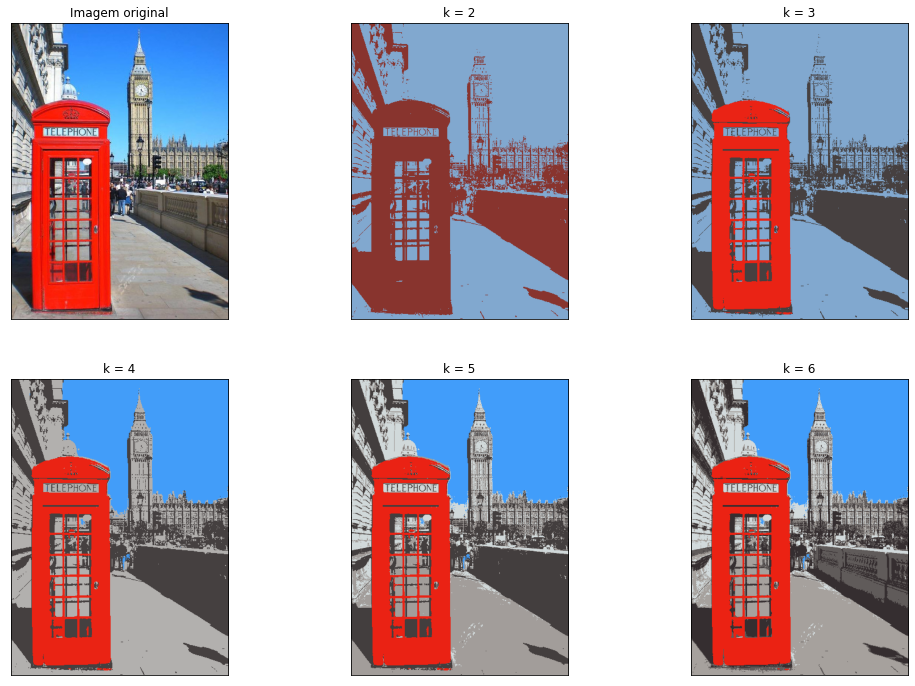

In [ ]:
img = cv2.imread("imagens/london-red-phonebox.jpg")
segmentacao_clustering(img)

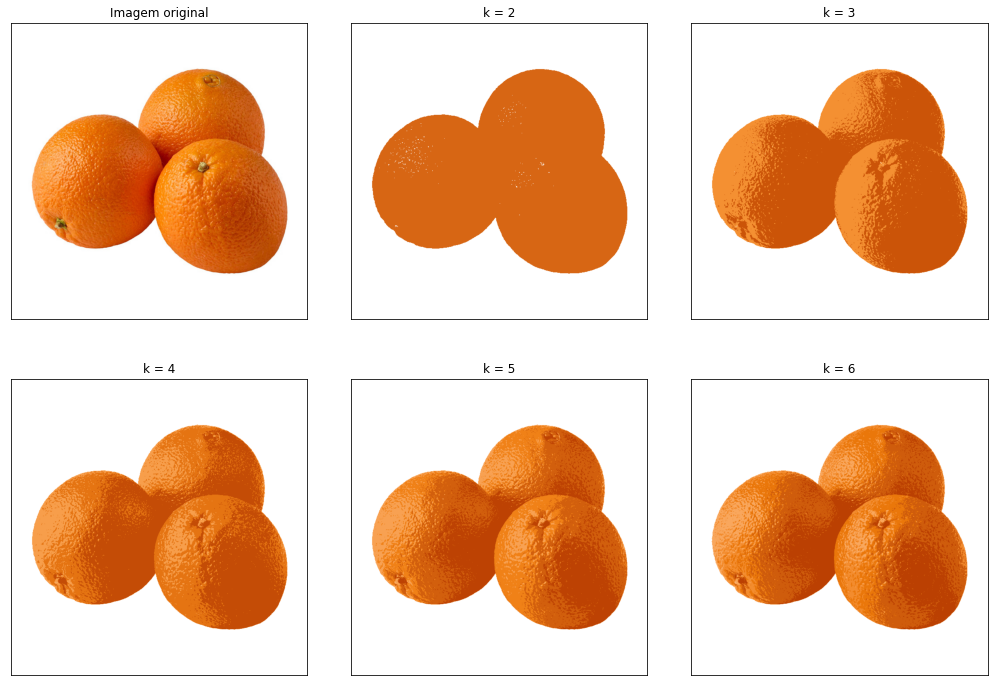

In [ ]:
img = cv2.imread("imagens/laranjas.jpg")
segmentacao_clustering(img)

# Segmentação com watershed

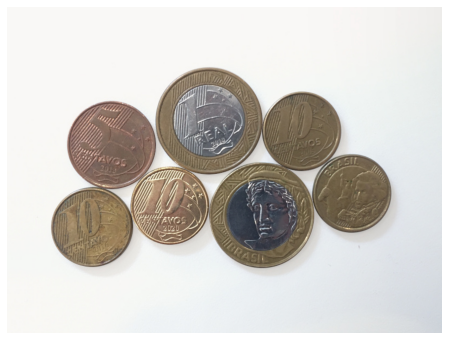

In [ ]:
img = cv2.imread('imagens/moedas03.jpg')
mostrar(img)

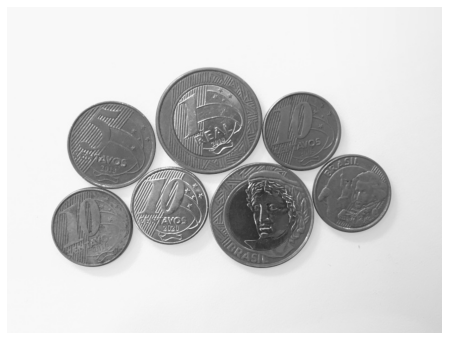

In [ ]:
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
mostrar(gray)

174.0


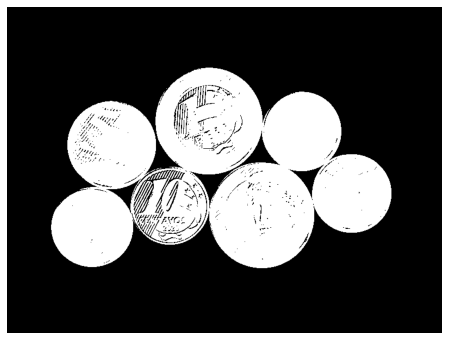

In [ ]:
val, thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)
print(val)
mostrar(thresh)

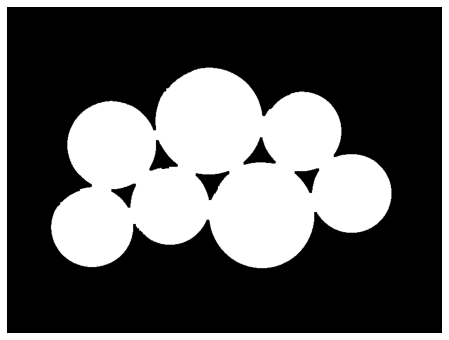

In [ ]:
dilatacao = cv2.dilate(thresh, np.ones((3,3), np.uint8), iterations = 2)
seg = cv2.erode(dilatacao, np.ones((3,3), np.uint8), iterations = 2)
mostrar(seg)

In [ ]:
from scipy import ndimage as ndi
from skimage.feature import peak_local_max
from skimage.segmentation import watershed

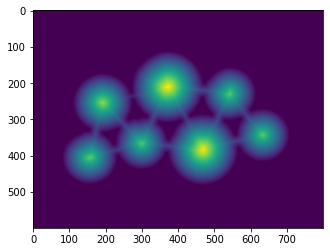

In [ ]:
dist = ndi.distance_transform_edt(seg)
plt.imshow(dist);

In [ ]:
img.shape

(600, 800, 3)

In [ ]:
dist.shape

(600, 800)

In [ ]:
dist[350]

array([ 0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.  

In [ ]:
local_max = peak_local_max(dist, indices = False, min_distance = 20, labels = seg)

In [ ]:
local_max, local_max.shape

(array([[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]]), (600, 800))

In [ ]:
markers = ndi.label(local_max, structure=np.ones((3,3)))[0]

In [ ]:
markers.shape

(600, 800)

In [ ]:
markers, np.unique(markers, return_counts=True)

(array([[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]], dtype=int32),
 (array([0, 1, 2, 3, 4, 5, 6, 7], dtype=int32),
  array([479993,      1,      1,      1,      1,      1,      1,      1])))

In [ ]:
labels = watershed(-dist, markers, mask=seg)

In [ ]:
np.unique(labels)

array([0, 1, 2, 3, 4, 5, 6, 7], dtype=int32)

In [ ]:
labels.shape

(600, 800)

In [ ]:
labels[280]

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

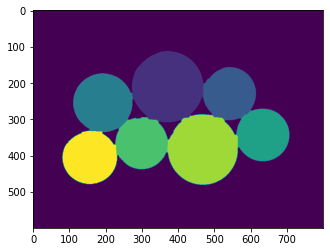

In [ ]:
plt.imshow(labels);

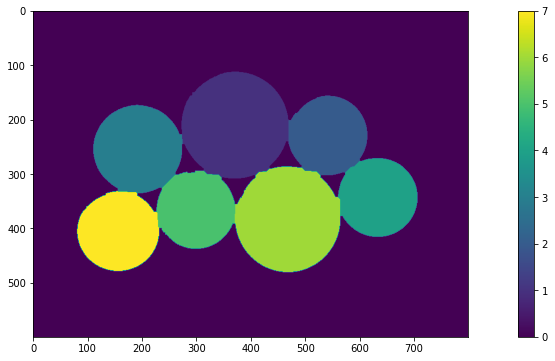

In [ ]:
fig = plt.gcf()
fig.set_size_inches(18,6)
plot = plt.imshow(labels)
plt.colorbar(plot);

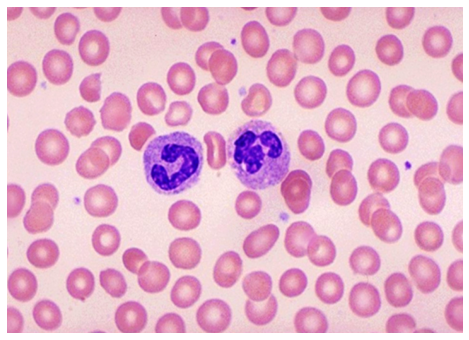

In [ ]:
img = cv2.imread('imagens/rbc.jpg')
mostrar(img)

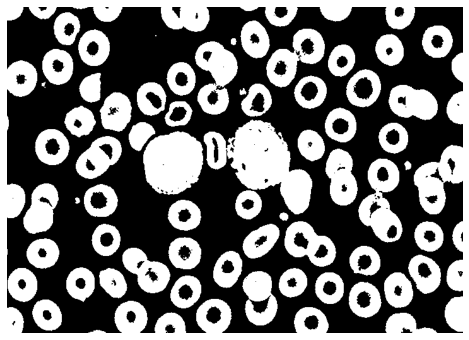

In [ ]:
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)[1]
mostrar(thresh)

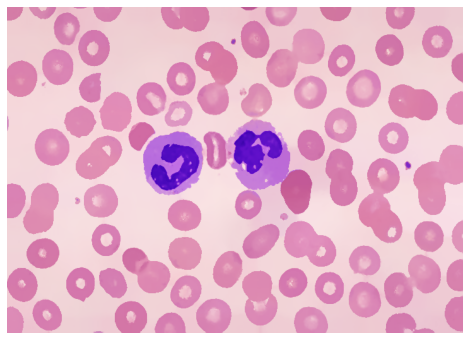

In [ ]:
filtro = cv2.pyrMeanShiftFiltering(img, 20, 40)
mostrar(filtro)

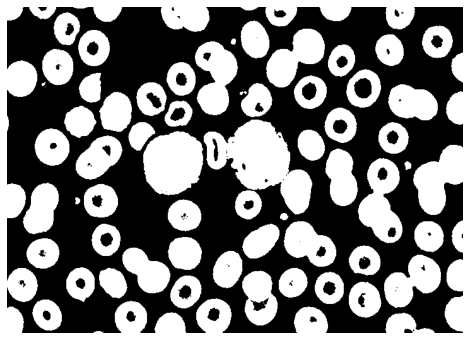

In [ ]:
gray = cv2.cvtColor(filtro, cv2.COLOR_BGR2GRAY)
thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)[1]
mostrar(thresh)

In [ ]:
def preenche_buracos(img_thresh, limiar = 1000):
  # 1 Detectar os contornos
  # 2 Verificar quais contornos estão abaixo do limiar
  # 3 Adicionaremos os contornos abaixo do limiar em uma lista
  # 4 Prencher os contornos pequenos
  contornos, _ = cv2.findContours(img_thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
  buracos = []
  for con in contornos:
    area = cv2.contourArea(con)
    if area < limiar:
      buracos.append(con)
  cv2.drawContours(img_thresh, buracos, -1, 255, -1)
  return img_thresh

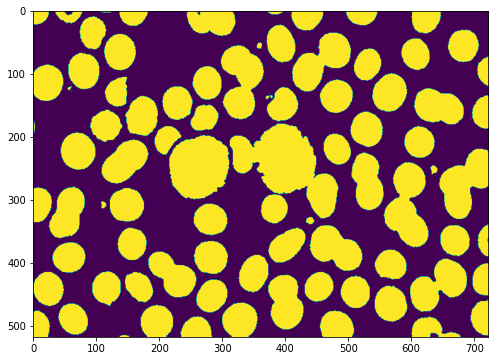

In [ ]:
seg = preenche_buracos(thresh)
fig = plt.gcf()
fig.set_size_inches(18, 6)
plt.imshow(seg);

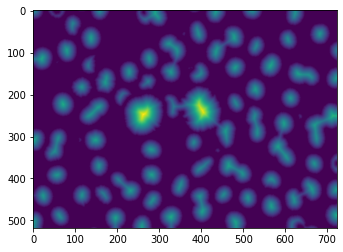

In [ ]:
dist = ndi.distance_transform_edt(seg)
plt.imshow(dist);

In [ ]:
local_max = peak_local_max(dist, indices=False, min_distance=20, labels=seg)

In [ ]:
markers = ndi.label(local_max, structure=np.ones((3, 3)))[0]

In [ ]:
labels = watershed(-dist, markers, mask=seg)

In [ ]:
print("Segmentos únicos encontrados: {}".format(len(np.unique(labels)) - 1))

Segmentos únicos encontrados: 83


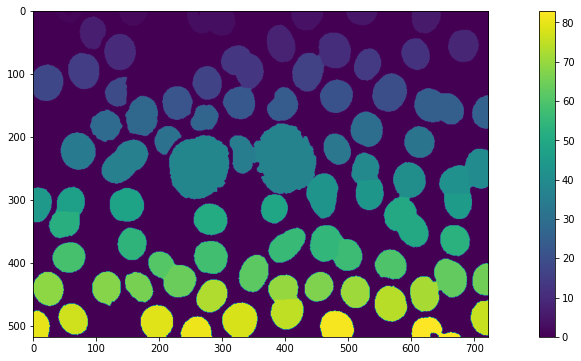

In [ ]:
fig = plt.gcf()
fig.set_size_inches(18, 6)
plot = plt.imshow(labels)
plt.colorbar(plot);

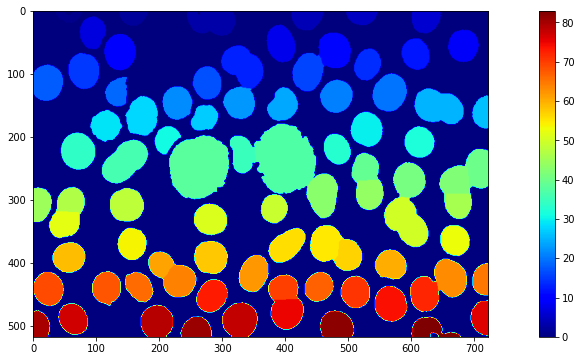

In [ ]:
# Mais colormaps: https://matplotlib.org/stable/tutorials/colors/colormaps.html 
fig = plt.gcf()
fig.set_size_inches(18, 6)
plot = plt.imshow(labels, cmap='jet')
plt.colorbar(plot);

In [ ]:
def segmentacao_watershed(img, preenchimento = 1000):
  original = gray = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  filtro = cv2.pyrMeanShiftFiltering(img, 20, 40)
  gray = cv2.cvtColor(filtro, cv2.COLOR_BGR2GRAY)
  thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)[1]

  if preenchimento > 0:
    thresh = preenche_buracos(thresh, preenchimento)

  dist = ndi.distance_transform_edt(thresh)
  dist_visual = dist.copy()
  local_max = peak_local_max(dist, indices=False, min_distance=20, labels=thresh)
  markers = ndi.label(local_max, structure=np.ones((3, 3)))[0]
  labels = watershed(-dist, markers, mask=thresh)

  titulos = ['Imagem Original', 'Limiarização (objetos juntos)', 'Distance Transform', 'Watershed (objetos separados)']
  imagens = [original, thresh, dist_visual, labels]

  fig = plt.gcf()
  fig.set_size_inches(16, 12)  
  for i in range(4):
      plt.subplot(2,2,i+1)
      # condição para colocar colormap jet apenas pra imagem com o resultado do watershed
      if (i == 3):
        cmap = "jet" 
      else:
        cmap = "gray"
      plt.imshow(imagens[i], cmap)
      plt.title(titulos[i]) 
      plt.xticks([]),plt.yticks([])     
  plt.show()
  return labels

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  if sys.path[0] == '':


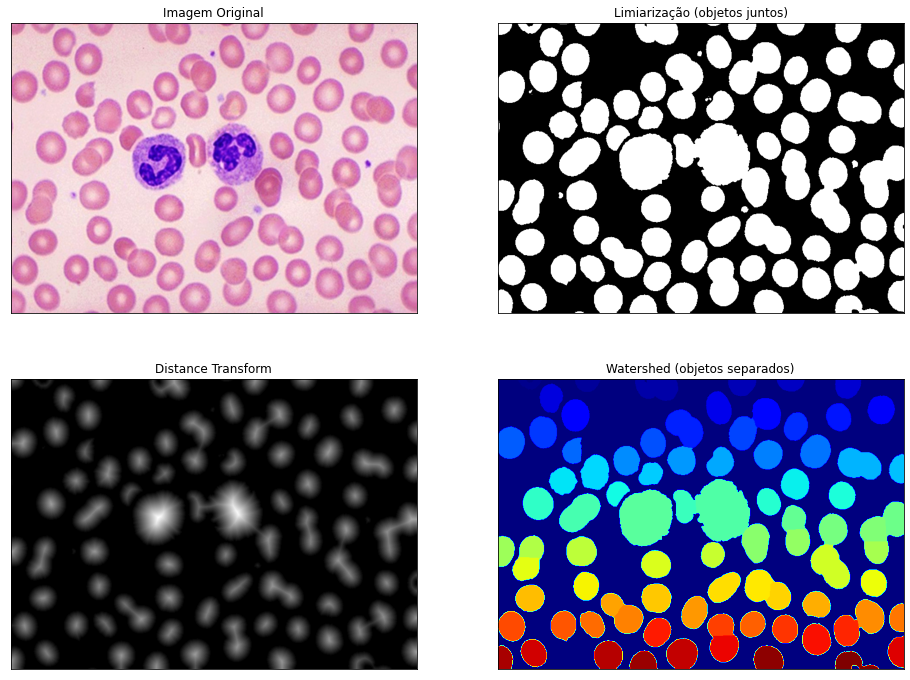

In [ ]:
img = cv2.imread('imagens/rbc.jpg')
segmentacao = segmentacao_watershed(img)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  if sys.path[0] == '':


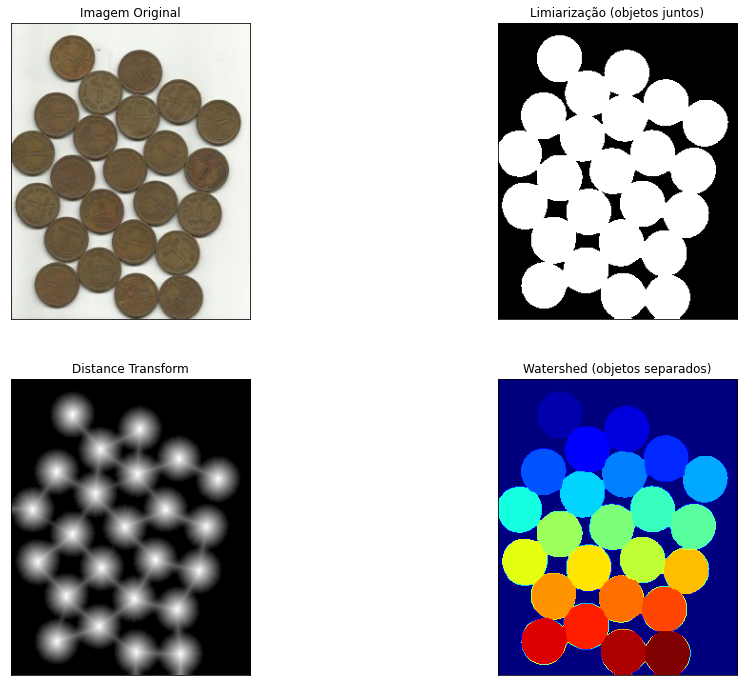

In [ ]:
img = cv2.imread("imagens/moedas04.jpg")
segmentacao = segmentacao_watershed(img, 0)

## Outras operações (pós watershed)

### Sobreposição à imagem original

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  if sys.path[0] == '':


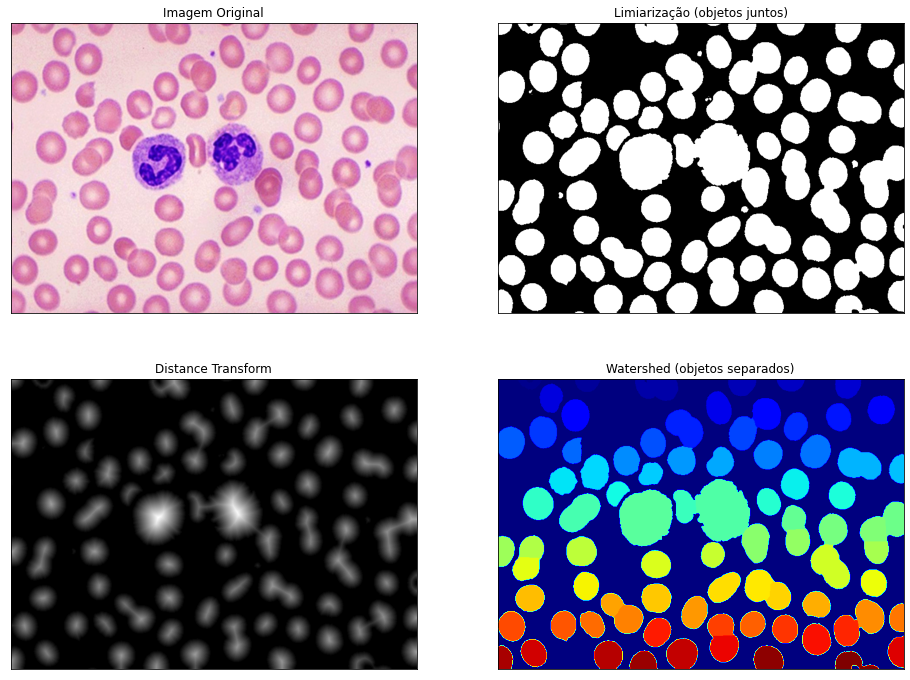

In [ ]:
img = cv2.imread('imagens/rbc.jpg')
labels = segmentacao_watershed(img)
cmap = plt.cm.jet

In [ ]:
print(labels.min(), labels.max())

0 83


In [ ]:
norm = plt.Normalize(vmin=labels.min(), vmax=labels.max())
seg_watershed = cmap(norm(labels))

In [ ]:
seg_watershed = ((seg_watershed * 255).astype(np.uint8))
seg_watershed = cv2.cvtColor(seg_watershed, cv2.COLOR_RGB2BGR)

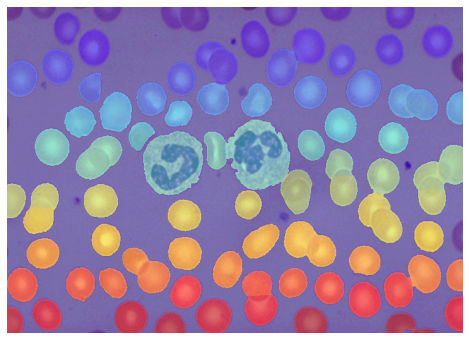

In [ ]:
img_sobreposicao = cv2.addWeighted(seg_watershed, 0.5, img, 0.5, 0)
mostrar(img_sobreposicao)

In [ ]:
cv2.imwrite('segmentacao_watershed.jpg', seg_watershed)
cv2.imwrite('segmentacao_watershed_sobreposicao.jpg', img_sobreposicao)

True

### Numeração dos segmentos

In [ ]:
np.unique(labels)

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
       68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83],
      dtype=int32)

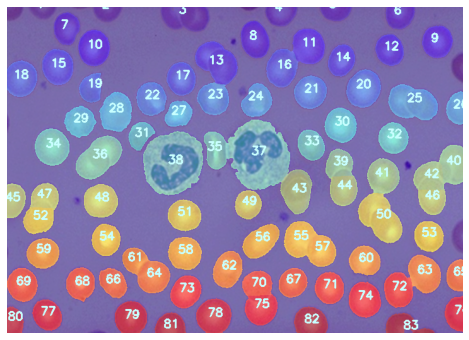

In [ ]:
img_final = img_sobreposicao.copy()
for label in np.unique(labels):
  if label == 0:
    continue
  mascara = np.zeros(gray.shape, dtype = 'uint8')
  mascara[labels == label] = 255
  cnts = cv2.findContours(mascara.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)[-2]
  c = max(cnts, key=cv2.contourArea)
  ((x,y), r) = cv2.minEnclosingCircle(c)
  cv2.putText(img_final, "{}".format(label), (int(x) - 10, int(y)), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255,255,200), 2)
mostrar(img_final)

# Segmentação por cores

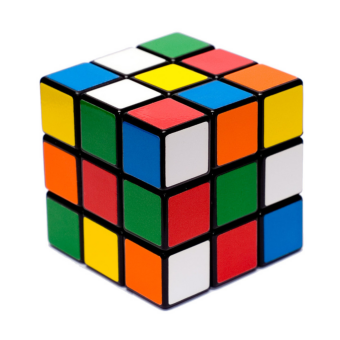

In [ ]:
img = cv2.imread('imagens/cubo_magico.jpg')
mostrar(img)

In [ ]:
# BGR
cor_min = (90, 10, 0)
cor_max = (255, 180, 40)

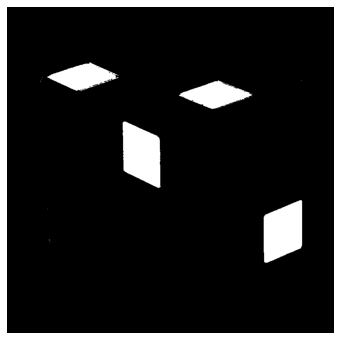

In [ ]:
mascara = cv2.inRange(img, cor_min, cor_max)
mostrar(mascara)

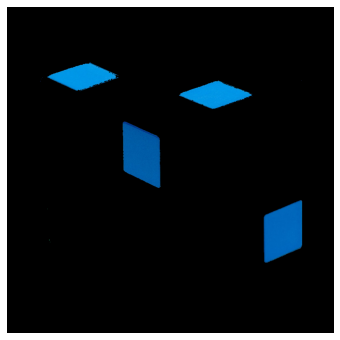

In [ ]:
segmento_cor = cv2.bitwise_and(img, img, mask = mascara)
mostrar(segmento_cor)

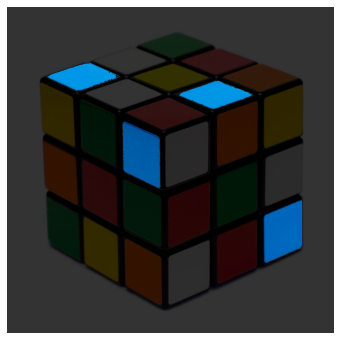

In [ ]:
seg_sobreposicao = cv2.addWeighted(segmento_cor, 0.8, img, 0.2, 0)
mostrar(seg_sobreposicao)

## Segmentação de várias cores

In [ ]:
cores = [
  ([90, 10, 0], [255, 180, 40]),    # azul
  ([0, 80, 0], [120, 255, 120]),    # verde
  ([8, 8, 160], [120, 120, 255]),   # vermelho
  ([0, 150, 200], [10, 255, 255]),  # amarelo
  ([0, 80, 240], [80, 165, 255]),   # laranja
]

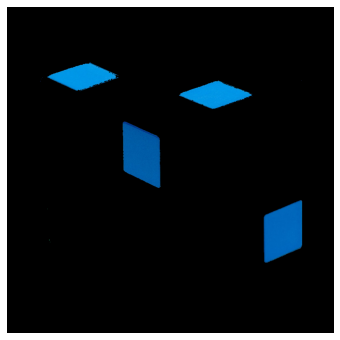

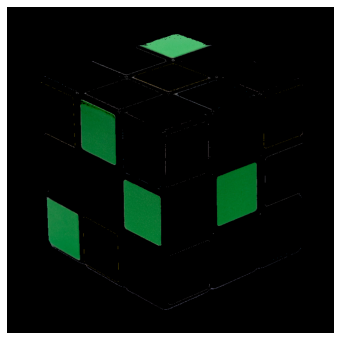

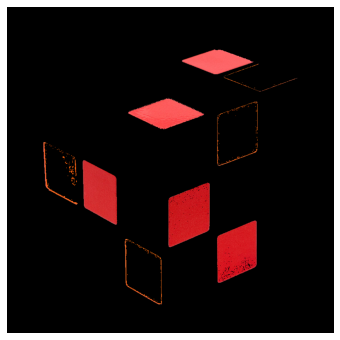

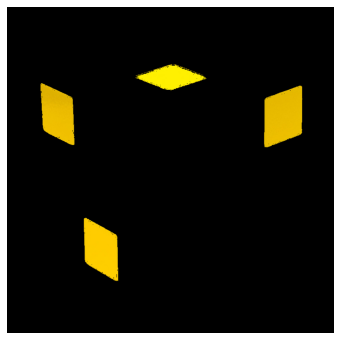

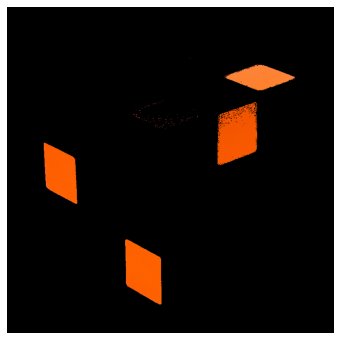

In [ ]:
for (minimo, maximo) in cores:
  #print(minimo, maximo)
  minimo = np.array(minimo, dtype = 'uint8')
  maximo = np.array(maximo, dtype = 'uint8')
  mascara = cv2.inRange(img, minimo, maximo)
  segmento = cv2.bitwise_and(img, img, mask = mascara)
  mostrar(segmento)

## Segmentação no espaço HSV

In [ ]:
img = cv2.imread('imagens/cubo_magico.jpg')
img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

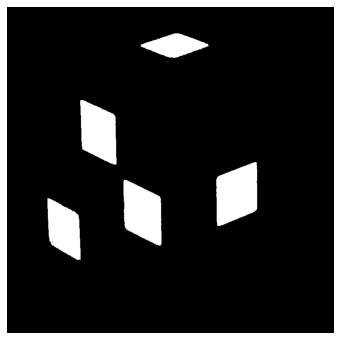

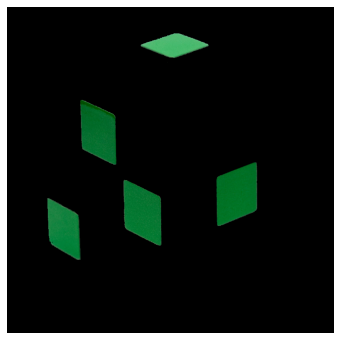

In [ ]:
minimo = (45, 80, 40)
maximo = (75, 255, 255)
mascara = cv2.inRange(img_hsv, minimo, maximo)
mostrar(mascara)
segmento = cv2.bitwise_and(img, img, mask = mascara)
mostrar(segmento)

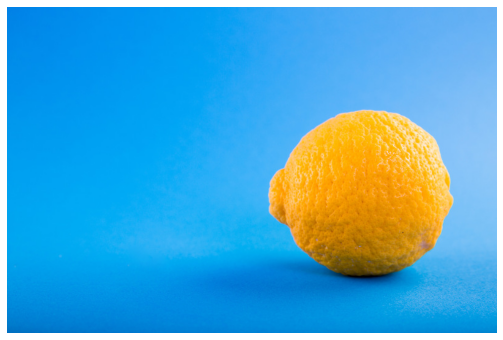

In [ ]:
img = cv2.imread('imagens/limao_amarelo.jpg')
img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
mostrar(img)

In [ ]:
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
from matplotlib import colors

In [ ]:
img.shape

(533, 800, 3)

In [ ]:
cores_pixels = img.reshape((np.shape(img)[0] * np.shape(img)[1], 3))
cores_pixels.shape

(426400, 3)

In [ ]:
norm = colors.Normalize(vmin=-1., vmax=1.)
norm.autoscale(cores_pixels)
cores_pixels = norm(cores_pixels).tolist()

In [ ]:
cores_pixels

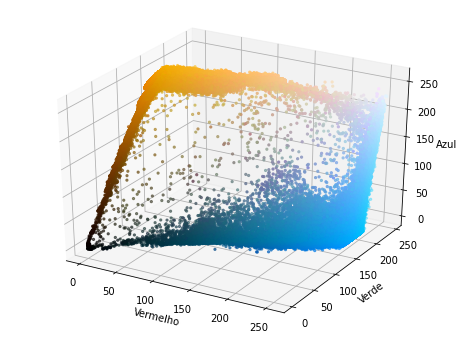

In [ ]:
rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
r, g, b = cv2.split(rgb)
fig = plt.figure()
fig.set_size_inches(8,6)
axis = fig.add_subplot(1,1,1,projection='3d')
axis.scatter(r.flatten(), g.flatten(), b.flatten(), facecolors=cores_pixels, marker='.')
axis.set_xlabel('Vermelho')
axis.set_ylabel('Verde')
axis.set_zlabel('Azul');

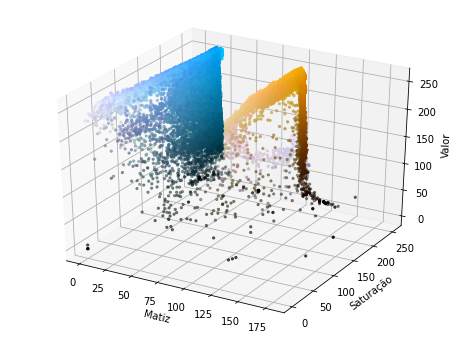

In [ ]:
h, s, v = cv2.split(img_hsv)
fig = plt.figure()
fig.set_size_inches(8, 6)
axis = fig.add_subplot(1, 1, 1, projection="3d")
axis.scatter(h.flatten(), s.flatten(), v.flatten(), facecolors=cores_pixels, marker=".")
axis.set_xlabel("Matiz")
axis.set_ylabel("Saturação")
axis.set_zlabel("Valor");

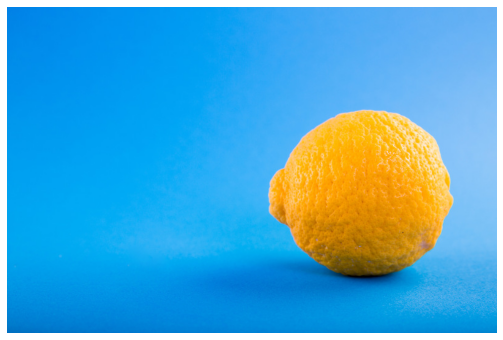

In [ ]:
img = cv2.imread('imagens/limao_amarelo.jpg')
img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
mostrar(img)

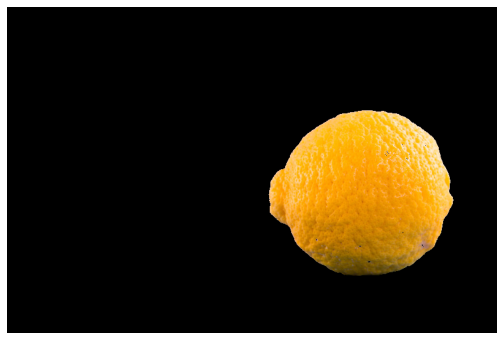

In [ ]:
minimo = (0, 20, 20)
maximo = (30, 255, 255)
minimo = np.array(minimo, dtype = "uint8")
maximo = np.array(maximo, dtype = "uint8")
mascara = cv2.inRange(img_hsv, minimo, maximo)
segmento = cv2.bitwise_and(img, img, mask = mascara)
mostrar(segmento)

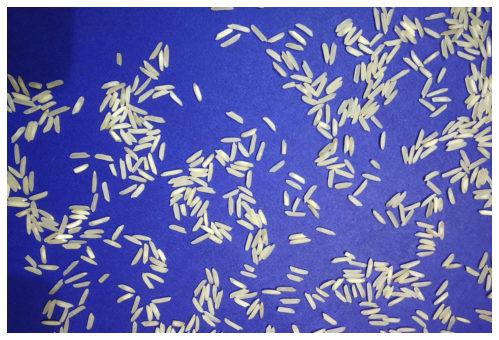

In [ ]:
img = cv2.imread("imagens/graos_arroz.jpg")
img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
mostrar(img)

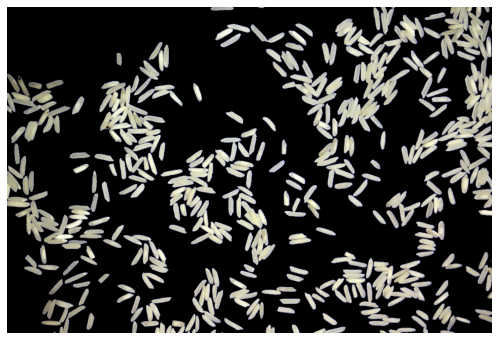

In [ ]:
minimo = (0, 0, 0)
maximo = (180, 100, 255)
minimo = np.array(minimo, dtype = "uint8")
maximo = np.array(maximo, dtype = "uint8")
mascara = cv2.inRange(img_hsv, minimo, maximo)
segmento = cv2.bitwise_and(img, img, mask = mascara)
mostrar(segmento)

## Efeito Chroma-key

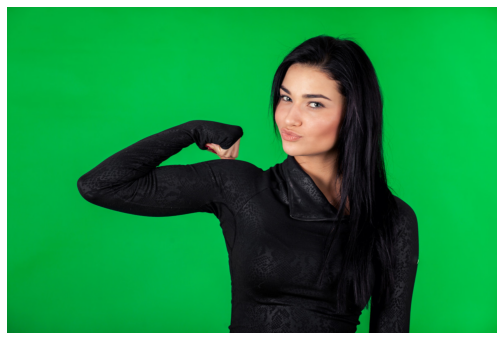

In [ ]:
img = cv2.imread("imagens/chromakey.jpg")
img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
mostrar(img)

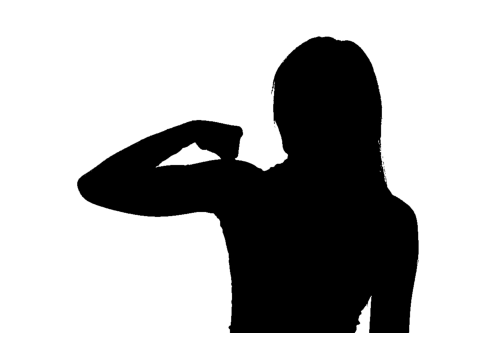

In [ ]:
minimo = (40, 80, 40)
maximo = (80, 255, 255)
minimo = np.array(minimo, dtype = "uint8")
maximo = np.array(maximo, dtype = "uint8")
mascara = cv2.inRange(img_hsv, minimo, maximo)
mostrar(mascara)

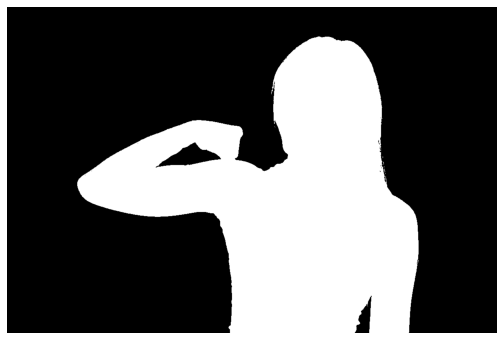

In [ ]:
mascara = 255 - mascara
mostrar(mascara)

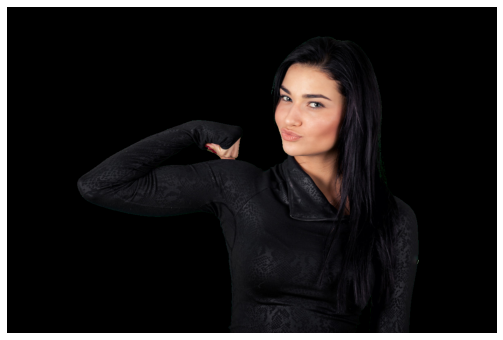

In [ ]:
segmento = cv2.bitwise_and(img, img, mask = mascara)
mostrar(segmento)

In [ ]:
altura, largura = img.shape[:2]
print(altura, largura)

800 1200


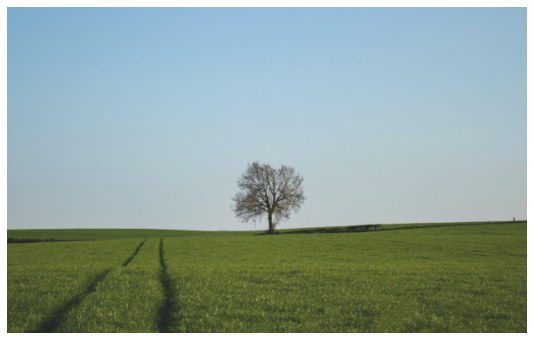

In [ ]:
img_final = img.copy()
fundo = cv2.imread('imagens/paisagem01.jpg')
mostrar(fundo)

In [ ]:
fundo.shape

(389, 620, 3)

In [ ]:
fundo = cv2.resize(fundo, (largura, altura))
fundo.shape

(800, 1200, 3)

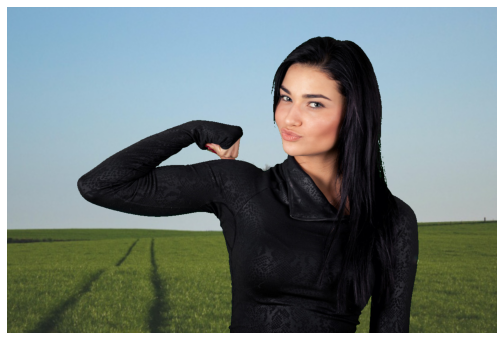

In [ ]:
img_final[mascara == 0] = fundo[mascara == 0]
mostrar(img_final)

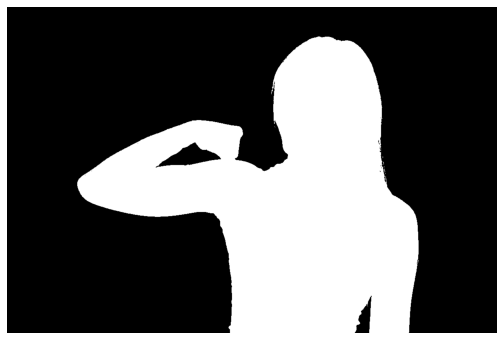

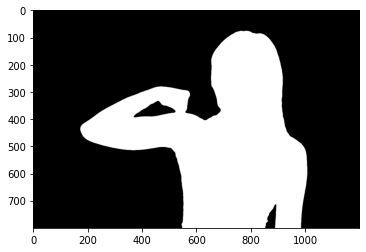

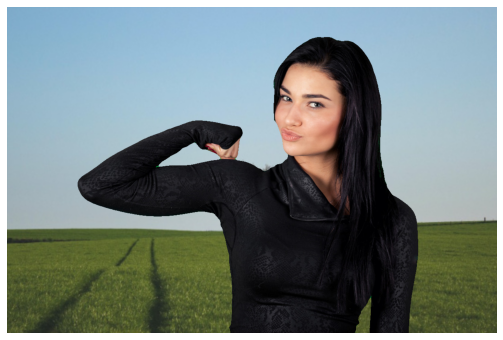

In [ ]:
mostrar(mascara)
import skimage.exposure
mascara_suave = mascara.copy()
mascara_suave = cv2.GaussianBlur(mascara_suave, (0,0), sigmaX=3, sigmaY=3, borderType = cv2.BORDER_DEFAULT)
mascara_suave = skimage.exposure.rescale_intensity(mascara_suave, in_range=(150,190), out_range=(0,255))
plt.imshow(mascara_suave, cmap='gray')
plt.show()

img_final = img.copy()
img_final[mascara_suave == 0] = fundo[mascara_suave == 0]
mostrar(img_final)